# Deloitte Media Consumption Survey 


# What predicts video and television subscription?
## This analysis surrounds examining which features best predict video and television subscription among respondents.

In [1]:
# Importing libraries
!pip install streamlit
import streamlit
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
!pip install shap
import shap
import matplotlib.pyplot as plt
%matplotlib inline
warnings.filterwarnings("ignore")
!pip install pywaffle
import pywaffle as pyw
import statsmodels.api as sm
!pip install xgboost
import xgboost as xgb
import shap
from pyarrow import csv, parquet, schema, string, float32, int32, int16, int64
from sklearn.feature_selection import SelectKBest, f_classif
from IPython.display import display, HTML
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.model_selection import cross_val_score
from tabulate import tabulate
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import accuracy_score,confusion_matrix
shap.initjs()
from sklearn.datasets import make_classification
from sklearn.dummy import DummyClassifier
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import StandardScaler
# Expand Python view to fit entire screen
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% ! important; }<style>"))

     --------------------------------------- 70.9/70.9 MB 14.9 MB/s eta 0:00:00


In [2]:
pd.options.display.max_columns = 100
pd.options.display.max_rows = 500

In [3]:
gaming_df = pd.read_csv("Deloitte.csv")

In [4]:
gaming_df.head()

,record - Record number,"Q1r1 - To begin, what is your age?",Q4 - What is your gender?,age - you are...,Q2 - In which state do you currently reside?,region - Region,QNEW3 - What is your employment status?,Q5 - Which category best describes your ethnicity?,QNEW1 - Do you have children living in your home (excluding yourself if you are under 18)?,QNEW2 - How old are the children in your home?-0-4 years,QNEW2 - How old are the children in your home?-5-9 years,QNEW2 - How old are the children in your home?-10-13 years,QNEW2 - How old are the children in your home?-14-18 years,QNEW2 - How old are the children in your home?-19-25 years,QNEW2 - How old are the children in your home?-26+ years,QNEW2 - How old are the children in your home?-Dont Know,"Q6 - Into which of the following categories does your total annual household income fall before taxes? Again, we promise to keep this, and all your answers, completely confidential.",Q8 - Which of the following media or home entertainment equipment does your household own?-Flat panel television,Q8 - Which of the following media or home entertainment equipment does your household own?-Digital video recorder (DVR),Q8 - Which of the following media or home entertainment equipment does your household own?-Streaming media box or over-the-top box,Q8 - Which of the following media or home entertainment equipment does your household own?-Portable streaming thumb drive/fob,Q8 - Which of the following media or home entertainment equipment does your household own?-Over-the-air digital TV antenna (for free access to network broadcast without pay TV subscription),Q8 - Which of the following media or home entertainment equipment does your household own?-Blu-ray disc player/DVD player,Q8 - Which of the following media or home entertainment equipment does your household own?-Gaming console,Q8 - Which of the following media or home entertainment equipment does your household own?-Portable video game player,Q8 - Which of the following media or home entertainment equipment does your household own?-Computer network/router in your home for wireless computer/laptop usage,Q8 - Which of the following media or home entertainment equipment does your household own?-Desktop computer,Q8 - Which of the following media or home entertainment equipment does your household own?-Laptop computer,Q8 - Which of the following media or home entertainment equipment does your household own?-Tablet,Q8 - Which of the following media or home entertainment equipment does your household own?-Dedicated e-book reader,Q8 - Which of the following media or home entertainment equipment does your household own?-Smartphone,Q8 - Which of the following media or home entertainment equipment does your household own?-Basic mobile phone (not a smartphone),Q8 - Which of the following media or home entertainment equipment does your household own?-Smart watch,Q8 - Which of the following media or home entertainment equipment does your household own?-Fitness band,Q8 - Which of the following media or home entertainment equipment does your household own?-Virtual reality headset,Q8 - Which of the following media or home entertainment equipment does your household own?-Drone,Q8 - Which of the following media or home entertainment equipment does your household own?-None of the above,Q8 - Which of the following media or home entertainment equipment does your household own?-Dont Know,"Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Flat panel television","Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Digital video recorder (DVR)","Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Streaming media box or over-the-top box","Q10 - Of those products you indicated you do not currently own, which of the following 

In [5]:
# Preprocessing 
# I want to see whether there are any missing values in this data set  

print('Missing Values %')
print('-'*25)
print(round(gaming_df.isnull().sum()/gaming_df.shape[0]*100,2))


Missing Values %
-------------------------
record - Record number                                                                                                                                                                                                                                                0.0
Q1r1 - To begin, what is your age?                                                                                                                                                                                                                                    0.0
Q4 - What is your gender?                                                                                                                                                                                                                                             0.0
age - you are...                                                                                                                                               

In [6]:
# These labels are too long, and so I need to shorten these labels
# Therefore, I'll use replacement to fix this
gaming_df.rename(columns={'Q4 - What is your gender?': 'Gender'}, inplace=True)
gaming_df.rename(columns={'region - Region': 'Region'}, inplace=True)
gaming_df.rename(columns={'age - you are...': 'Age'}, inplace=True)
gaming_df.rename(columns={'Q2 - In which state do you currently reside?': 'State'}, inplace=True)
gaming_df.rename(columns={'Q5 - Which category best describes your ethnicity?': 'Ethnicity' }, inplace=True)
gaming_df.rename(columns={'QNEW2 - How old are the children in your home?-0-4 years': 'Children 0-4 years'}, inplace=True)
gaming_df.rename(columns={'QNEW2 - How old are the children in your home?-5-9 years': 'Children 5-9 years'}, inplace=True)
gaming_df.rename(columns={'QNEW2 - How old are the children in your home?-10-13 years': 'Children 10-13 years'}, inplace=True)
gaming_df.rename(columns={'QNEW2 - How old are the children in your home?-14-18 years': 'Children 14-18 years'}, inplace=True)
gaming_df.rename(columns={'QNEW2 - How old are the children in your home?-19-25 years': 'Children 19-25 years'}, inplace=True)
gaming_df.rename(columns={'QNEW2 - How old are the children in your home?-26+ years': 'Children 26+years'}, inplace=True)
gaming_df.rename(columns={'Q6 - Into which of the following categories does your total annual household income fall before taxes? Again, we promise to keep this, and all your answers, completely confidential.': 'Household_Income'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Flat panel television': 'Own Flat Panel TV'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Digital video recorder (DVR)': 'Own DVR'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Streaming media box or over-the-top box': 'Own streaming media box or over-the-top box'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Portable streaming thumb drive/fob': 'Own Portable streaming thumb drive/fob'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Over-the-air digital TV antenna (for free access to network broadcast without pay TV subscription)': 'Own Over-the-air digital TV antenna (for free access to network broadcast without pay TV subscription)'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Blu-ray disc player/DVD player': 'Own Blu-ray disc player/DVD player'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Gaming console': 'Own Gaming console'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Portable video game player': 'Own Portable video game player'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Computer network/router in your home for wireless computer/laptop usage': 'Own Computer network/router'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Desktop computer': 'Own Desktop computer'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Laptop computer': 'Own Laptop computer'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Tablet': 'Own Tablet'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Dedicated e-book reader': 'Own Dedicated e-book reader'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Smartphone': 'Own Smartphone'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Basic mobile phone (not a smartphone)': 'Own Basic mobile phone'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Smart watch': 'Own Smart watch'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Fitness band': 'Own Fitness band'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Virtual reality headset': 'Own Virtual reality headset'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Drone': 'Own Drone'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-None of the above': 'Own None of the above'}, inplace=True)
gaming_df.rename(columns={'QNEW2 - How old are the children in your home?-0-4 years': 'Children 0-4 years'}, inplace=True)
gaming_df.rename(columns={'QNEW2 - How old are the children in your home?-5-9 years': 'Children 5-9 years'}, inplace=True)
gaming_df.rename(columns={'QNEW2 - How old are the children in your home?-10-13 years': 'Children 10-13 years'}, inplace=True)
gaming_df.rename(columns={'QNEW2 - How old are the children in your home?-14-18 years': 'Children 14-18 years'}, inplace=True)
gaming_df.rename(columns={'QNEW2 - How old are the children in your home?-19-25 years': 'Children 19-25 years'}, inplace=True)
gaming_df.rename(columns={'QNEW2 - How old are the children in your home?-26+ years': 'Children 26+years'}, inplace=True)
gaming_df.rename(columns={'Q6 - Into which of the following categories does your total annual household income fall before taxes? Again, we promise to keep this, and all your answers, completely confidential.': 'Household Income'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Flat panel television': 'Own Flat Panel TV'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Digital video recorder (DVR)': 'Own DVR'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Streaming media box or over-the-top box': 'Own streaming media box or over-the-top box'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Portable streaming thumb drive/fob': 'Own Portable streaming thumb drive/fob'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Over-the-air digital TV antenna (for free access to network broadcast without pay TV subscription)': 'Own Over-the-air digital TV antenna (for free access to network broadcast without pay TV subscription)'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Blu-ray disc player/DVD player': 'Own Blu-ray disc player/DVD player'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Gaming console': 'Own Gaming console'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Portable video game player': 'Own Portable video game player'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Computer network/router in your home for wireless computer/laptop usage': 'Own Computer network/router'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Desktop computer': 'Own Desktop computer'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Laptop computer': 'Own Laptop computer'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Tablet': 'Own Tablet'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Dedicated e-book reader': 'Own Dedicated e-book reader'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Smartphone': 'Own Smartphone'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Basic mobile phone (not a smartphone)': 'Own Basic mobile phone'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Smart watch': 'Own Smart watch'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Fitness band': 'Own Fitness band'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Virtual reality headset': 'Own Virtual reality headset'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Drone': 'Own Drone'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-None of the above': 'Own None of the above'}, inplace=True)
gaming_df.rename(columns={'Q8 - Which of the following media or home entertainment equipment does your household own?-Dont Know': 'Dont Know'}, inplace=True)
gaming_df.rename(columns={'Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Flat panel television': 'Purchase Flat panel in next 12 months'}, inplace=True)
gaming_df.rename(columns={'Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Digital video recorder (DVR)': 'Purchase digital video recorder (DVR) in next 12 months'}, inplace=True)
gaming_df.rename(columns={'Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Streaming media box or over-the-top box': 'Purchase Streaming media box or over-the-top box in next 12 months'}, inplace=True)
gaming_df.rename(columns={'Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Portable streaming thumb drive/fob': 'Purchase Portable streaming thumb drive/fob in next 12 months'}, inplace=True)
gaming_df.rename(columns={'Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Over-the-air digital TV antenna (for free access to network broadcast without pay TV subscription)': 'Purchase Over the top digital TV antenna in next 12 months'}, inplace=True)
gaming_df.rename(columns={'Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Blu-ray disc player/DVD player': 'Purchase Blu-ray disc player/DVD player in next 12 months'}, inplace=True)
gaming_df.rename(columns={'Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Gaming console': 'Purchase gaming console in next 12 months'}, inplace=True)
gaming_df.rename(columns={'Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Portable video game player': 'Purchase Portable video game player in next 12 months'}, inplace=True)
gaming_df.rename(columns={'Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Computer network/router in your home for wireless computer/laptop usage': 'Purchase computer network/router in next 12 months'}, inplace=True)
gaming_df.rename(columns={'Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Desktop computer': 'Purchase Desktop computer in next 12 months'}, inplace=True)
gaming_df.rename(columns={'Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Laptop computer': 'Purchase Laptop Desktop computer in next 12 months'}, inplace=True)
gaming_df.rename(columns={'Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Tablet': 'Purchase Tablet in next 12 months'}, inplace=True)
gaming_df.rename(columns={'Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Dedicated e-book reader': 'Purchase Dedicated e-book reader in next 12 months'}, inplace=True)
gaming_df.rename(columns={'Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Smartphone': 'Purchase Smartphone in next 12 months'}, inplace=True)
gaming_df.rename(columns={'Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Basic mobile phone (not a smartphone)': 'Purchase Basic moblie phone in next 12 months'}, inplace=True)
gaming_df.rename(columns={'Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Smart watch': 'Purchase Smart watch in next 12 months'}, inplace=True)
gaming_df.rename(columns={'Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Fitness band': 'Purchase Fitness band in next 12 months'}, inplace=True)
gaming_df.rename(columns={'Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Virtual reality headset': 'Purchase Virtual reality headset in next 12 months'}, inplace=True)
gaming_df.rename(columns={'Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Drone': 'Purchase Drone in next 12 months'}, inplace=True)
gaming_df.rename(columns={'Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-None of the above': 'Purchase None of the above in next 12 months'}, inplace=True)
gaming_df.rename(columns={"Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Don't Know": "Purchase Don't Know in next 12 months"}, inplace=True)
gaming_df.rename(columns={'Q11r1 - Flat panel television - Of the products you indicated you own, which [totalcount] do you value the most? Please rank the top [totalcount], with "1" being the most valued. Make your selections by clicking each item in the order you wish to rank.': 'Value flat panel TV'}, inplace=True)
gaming_df.rename(columns={'Q11r2 - Digital video recorder (DVR) - Of the products you indicated you own, which [totalcount] do you value the most? Please rank the top [totalcount], with "1" being the most valued. ': 'Value Digital video recorder (DVR)'}, inplace=True)
gaming_df.rename(columns={'Q11r3 - Streaming media box or over-the-top box  - Of the products you indicated you own, which [totalcount] do you value the most? Please rank the top [totalcount], with "1" being the most valued. ': 'Value Streaming media box or over-the-top'}, inplace=True)
gaming_df.rename(columns={'Q11r4 - Portable streaming thumb drive/fob  - Of the products you indicated you own, which [totalcount] do you value the most? Please rank the top [totalcount], with "1" being the most valued.': 'Value Portable streaming thumb drive/fob'}, inplace=True)
gaming_df.rename(columns={'Q11rNew1 - Over-the-air digital TV antenna (for free access to network broadcast without pay TV subscription) - Of the products you indicated you own, which [totalcount] do you value the most? Please rank the top [totalcount], with "1" being the most value': 'Value Over-the-air digital TV antenna'}, inplace=True)
gaming_df.rename(columns={'Q11r5 - Blu-ray disc player/DVD player - Of the products you indicated you own, which [totalcount] do you value the most? Please rank the top [totalcount], with "1" being the most valued. Make your selections by clicking each item in the order you wish to': 'Value Blu-ray disc player/DVD player'}, inplace=True)
gaming_df.rename(columns={'Q11r6 - Gaming console  - Of the products you indicated you own, which [totalcount] do you value the most? Please rank the top [totalcount], with "1" being the most valued. Make your selections by clicking each item in the order you wish': 'Value Gaming console'}, inplace=True)
gaming_df.rename(columns={'Q11r7 - Portable video game player - Of the products you indicated you own, which [totalcount] do you value the most? Please rank the top [totalcount], with "1" being the most valued. Make your selections by clicking each': 'Value Portable video game player'}, inplace=True)
gaming_df.rename(columns={'Q11r8 - Computer network/router in your home for wireless computer/laptop usage - Of the products you indicated you own, which [totalcount] do you value the most? Please rank the top [totalcount], with "1" being the most va': 'Value Computer network/router'}, inplace=True)
gaming_df.rename(columns={'Q11r9 - Desktop computer - Of the products you indicated you own, which [totalcount] do you value the most? Please rank the top [totalcount], with "1" being the most valued. Make your selections by clicking each item in the order you wish to rank.  ': 'Value Desktop computer'}, inplace=True)
gaming_df.rename(columns={'Q11r10 - Laptop computer - Of the products you indicated you own, which [totalcount] do you value the most? Please rank the top [totalcount], with "1" being the most valued. Make your selections by clicking each item in the order you wish to rank.': 'Value Laptop computer'}, inplace=True)
gaming_df.rename(columns={'Q11r12 - Tablet - Of the products you indicated you own, which [totalcount] do you value the most? Please rank the top [totalcount], with "1" being the most valued. Make your selections by clicking each item in the orde': 'Value Tablet'}, inplace=True)
gaming_df.rename(columns={'Q11r14 - Dedicated e-book reader - Of the products you indicated you own, which [totalcount] do you value the most? Please rank the top [totalcount], with "1" being the most valued. Make your selections by clicking each item in': 'Value Dedicated e-book reader'}, inplace=True)
gaming_df.rename(columns={'Q11r15 - Smartphone - Of the products you indicated you own, which [totalcount] do you value the most? Please rank the top [totalcount], with "1" being the most valued. Make your selections by clicking each item in th': 'Value Smartphone'}, inplace=True)
gaming_df.rename(columns={'Q11r17 - Basic mobile phone (not a smartphone) - Of the products you indicated you own, which [totalcount] do you value the most? Please rank the top [totalcount], with "1" being the most valued. Make your selections by clicking each item in the order you': 'Value Basic mobile phone'}, inplace=True)
gaming_df.rename(columns={'Q11r18 - Smart watch - Of the products you indicated you own, which [totalcount] do you value the most? Please rank the top [totalcount], with "1" being the most valued. Make your selections by clicking each item i': 'Value Smart watch'}, inplace=True)
gaming_df.rename(columns={'Q11r19 - Fitness band - Of the products you indicated you own, which [totalcount] do you value the most? Please rank the top [totalcount], with "1" being the most valued. Make your selections by clicking each item in the order': 'Value Fitness band'}, inplace=True)
gaming_df.rename(columns={'Q11rNew2 - Virtual reality headset - Of the products you indicated you own, which [totalcount] do you value the most? Please rank the top [totalcount], with "1" being the most valued. Make your sele': 'Value Virtual reality headset'}, inplace=True)
gaming_df.rename(columns={'Q11rNew3 - Drone - Of the products you indicated you own, which [totalcount] do you value the most? Please rank the top [totalcount], with "1" being the most valued. Make your selections by clicking each item in the order you wish to rank.  ': 'Value Drone'}, inplace=True)
gaming_df.rename(columns={'Q11r22 - Placeholder - Of the products you indicated you own, which [totalcount] do you value the most? Please rank the top [totalcount], with "1" being the most valued. Make your selections by clicking each item in the order you wish to rank.  ': 'Value Placeholder'}, inplace=True)
gaming_df.rename(columns={'Q15r1 - Smartphone - Of the time you spend watching movies, what percentage of time do you watch on the following devices?': '% View movies on Smartphone'}, inplace=True)
gaming_df.rename(columns={'Q15r2 - Tablet - Of the time you spend watching movies, what percentage of time do you watch on the following devices?': '% View movies on Tablet'}, inplace=True)
gaming_df.rename(columns={'Q15r3 - Laptop/Desktop - Of the time you spend watching movies, what percentage of time do you watch on the following devices?': '% View movies on Laptop/Desktop'}, inplace=True)
gaming_df.rename(columns={'Q15r4 - Television - Of the time you spend watching movies, what percentage of time do you watch on the following devices?' : '% View movies on Television'}, inplace=True)
gaming_df.rename(columns={'Q16r1 - Smartphone - Of the time you spend watching sports, what percentage of time do you watch on the following devices?' : '% View sports on Smartphone'}, inplace=True)
gaming_df.rename(columns={'Q16r2 - Tablet - Of the time you spend watching sports, what percentage of time do you watch on the following devices?' : '% View sports on Tablet'}, inplace=True)
gaming_df.rename(columns={'Q16r3 - Laptop/Desktop - Of the time you spend watching sports, what percentage of time do you watch on the following devices?' : '% View sports on Laptop/Desktop'}, inplace=True)
gaming_df.rename(columns={'Q16r4 - Television - Of the time you spend watching sports, what percentage of time do you watch on the following devices?' : '% View sports on Television'}, inplace=True)
gaming_df.rename(columns={'Q17r1 - Smartphone - Of the time you spend watching TV shows , what percentage of time do you watch on the following devices?' : '% View TV shows on Smartphone'}, inplace=True)
gaming_df.rename(columns={'Q17r2 - Tablet - Of the time you spend watching TV shows , what percentage of time do you watch on the following devices?' : '% View TV shows on Tablet'}, inplace=True)
gaming_df.rename(columns={'Q17r3 - Laptop/Desktop - Of the time you spend watching TV shows , what percentage of time do you watch on the following devices?' : '% View TV shows on Laptop/Desktop'}, inplace=True)
gaming_df.rename(columns={'Q17r4 - Television - Of the time you spend watching TV shows , what percentage of time do you watch on the following devices?' : '% View TV shows on Television'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Photo/video' : 'Types of apps used - Photo/video'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Banking' : 'Types of apps used - Banking'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Fitness/health' : 'Types of apps used - Fitness/health'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Food/drink' : 'Types of apps used - Food/drink'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Retail/shopping' : 'Types of apps used - Retail/shopping'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Navigation' : 'Types of apps used - Navigation'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Social networks' : 'Types of apps used - Social networks'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Reading books' : 'Types of apps used - Reading books'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Streaming music' : 'Types of apps used - Streaming music'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Streaming video' : 'Types of apps used - Streaming video'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Reviews/guides' : 'Types of apps used - Reviews/guides'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-News consolidator' : 'Types of apps used - News consolidator'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Newspaper/news broadcaster' : 'Types of apps used - Newspaper/news broadcaster'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Magazines' : 'Types of apps used - Magazines'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Diagnostic/utilities' : 'Types of apps used - Diagnostic/utilities'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-QR Reader' : 'Types of apps used - QR Reader'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Travel' : 'Types of apps used - Travel'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Transportation' : 'Types of apps used - Transportation'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Location' : 'Types of apps used - Location'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Language' : 'Types of apps used - Language'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Movie' : 'Types of apps used - Movie'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Business' : 'Types of apps used - Business'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Games' : 'Types of apps used - Games'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Productivity' : 'Types of apps used - Productivity'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Sports' : 'Types of apps used - Sports'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Weather' : 'Types of apps used - Weather'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Browser' : 'Types of apps used - Browser'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-VOIP' : 'Types of apps used - VOIP'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Dating' : 'Types of apps used - Dating'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Messaging' : 'Types of apps used - Messaging'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Mobile payment' : 'Types of apps used - Mobile payment'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Education' : 'Types of apps used - Education'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Tickets' : 'Types of apps used - Tickets'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Reservations' : 'Types of apps used - Reservations'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Special interest/Hobby apps' : 'Types of apps used - Special interest/Hobby apps'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-I do not use any of the above types of apps on a frequent (everyday/weekly) basis.' : 'Types of apps used - None'}, inplace=True)
gaming_df.rename(columns={'Q22 - What types of apps do you use frequently (everyday/weekly) on your smartphone?-Dont Know' : 'Types of apps used - Dont Know'}, inplace=True)
gaming_df.rename(columns={'Q26 - Which of the following subscriptions does your household purchase?-Pay TV (traditional cable and/or satellite bundle)' : 'Subscriptions - Pay TV'}, inplace=True)
gaming_df.rename(columns={'Q26 - Which of the following subscriptions does your household purchase?-Home internet' : 'Subscriptions - Home Internet'}, inplace=True)
gaming_df.rename(columns={'Q26 - Which of the following subscriptions does your household purchase?-Landline telephone' : 'Subscriptions - Landline telephone'}, inplace=True)
gaming_df.rename(columns={'Q26 - Which of the following subscriptions does your household purchase?-Mobile voice (smartphone or basic mobile phone calling plan)' : 'Subscriptions - Mobile voice'}, inplace=True)
gaming_df.rename(columns={'Q26 - Which of the following subscriptions does your household purchase?-Mobile data plan' : 'Subscriptions - Mobile data plan'}, inplace=True)
gaming_df.rename(columns={'Q26 - Which of the following subscriptions does your household purchase?-Streaming video service' : 'Subscriptions - Streaming video service'}, inplace=True)
gaming_df.rename(columns={'Q26 - Which of the following subscriptions does your household purchase?-Streaming music service' : 'Subscriptions - Streaming music service'}, inplace=True)
gaming_df.rename(columns={'Q26 - Which of the following subscriptions does your household purchase?-Gaming' : 'Subscriptions - Gaming'}, inplace=True)
gaming_df.rename(columns={'Q26 - Which of the following subscriptions does your household purchase?-News/Newspaper (print or digital)' : 'Subscriptions - News/Newspaper(print or digital)'}, inplace=True)
gaming_df.rename(columns={'Q26 - Which of the following subscriptions does your household purchase?-Magazine (print or digital)' : 'Subscriptions - Magazine (print or digital)'}, inplace=True)
gaming_df.rename(columns={'Q26 - Which of the following subscriptions does your household purchase?-None of the above' : 'Subscriptions - None of the above'}, inplace=True)
gaming_df.rename(columns={'Q26 - Which of the following subscriptions does your household purchase?-Dont Know' : 'Subscriptions - Dont Know'}, inplace=True)
gaming_df.rename(columns={'Q36r1 - Pay TV (traditional cable and/or satellite bundle) - Of the services you indicated your household purchases, which [totalcount] do you value the most?Please rank the top [totalcount], with "1" being the most valued. ' : 'Value the most - Pay TV'}, inplace=True)
gaming_df.rename(columns={'Q36r2 - Home internet - Of the services you indicated your household purchases, which [totalcount] do you value the most?Please rank the top [totalcount], with "1" being the most valued. ' : 'Value the most - Home Internet'}, inplace=True)
gaming_df.rename(columns={'Q36r3 - Landline telephone - Of the services you indicated your household purchases, which [totalcount] do you value the most?Please rank the top [totalcount], with "1" being the most valued. ' : 'Value the most - Landline telephone'}, inplace=True)
gaming_df.rename(columns={'Q36r4 - Mobile voice - Of the services you indicated your household purchases, which [totalcount] do you value the most?Please rank the top [totalcount], with "1" being the most valued. ' : 'Value the most - Mobile voice'}, inplace=True)
gaming_df.rename(columns={'Q36r5 - Mobile data plan - Of the services you indicated your household purchases, which [totalcount] do you value the most?Please rank the top [totalcount], with "1" being the most valued. ' : 'Value the most - Mobile data plan'}, inplace=True)
gaming_df.rename(columns={'Q36r6 - Streaming video service - Of the services you indicated your household purchases, which [totalcount] do you value the most?Please rank the top [totalcount], with "1" being the most valued. ' : 'Value the most - Streaming video service'}, inplace=True)
gaming_df.rename(columns={'Q36r7 - Streaming music service - Of the services you indicated your household purchases, which [totalcount] do you value the most?Please rank the top [totalcount], with "1" being the most valued. ' : 'Value the most - Streaming music service'}, inplace=True)
gaming_df.rename(columns={'Q36r8 - Gaming - Of the services you indicated your household purchases, which [totalcount] do you value the most?Please rank the top [totalcount], with "1" being the most valued. ' : 'Value the most - Gaming'}, inplace=True)
gaming_df.rename(columns={'Q36r9 - News/Newspaper (print or digital) - Of the services you indicated your household purchases, which [totalcount] do you value the most?Please rank the top [totalcount], with "1" being the most valued. ' : 'Value the most - News/Newspaper(print or digital)'}, inplace=True)
gaming_df.rename(columns={'Q36r10 - Magazine (print or digital) - Of the services you indicated your household purchases, which [totalcount] do you value the most?Please rank the top [totalcount], with "1" being the most valued. ': 'Value the most - Magazine'}, inplace=True)
gaming_df.rename(columns={'Q29 - You said that you subscribe to home Internet access, how much more would you be willing to pay to receive double your download speed?': 'Willing to pay to double download speed'}, inplace=True)
gaming_df.rename(columns={'Q37r1 - Attending live performances (sporting events, concerts, or stage (musical, dramatic, or other)) - For the following types of entertainment activities, please rank your top three, with "1" being the most preferred.': 'Rank - Attending live performances'}, inplace=True)
gaming_df.rename(columns={'Q37r2 - Going to the movies - For the following types of entertainment activities, please rank your top three, with "1" being the most preferred.': 'Rank - Going to the movies'}, inplace=True)
gaming_df.rename(columns={'Q37r3 - Watching television (video content on any device) - For the following types of entertainment activities, please rank your top three, with "1" being the most preferred.Please rank the top three.': 'Rank - Watching television'}, inplace=True)
gaming_df.rename(columns={'Q37r4 - Listening to music (using any device) - For the following types of entertainment activities, please rank your top three, with "1" being the most preferred.': 'Rank - Listening to music'}, inplace=True)
gaming_df.rename(columns={'Q37r5 - Reading books (either physical books or via an e-book reader and/or online) - For the following types of entertainment activities, please rank your top three, with "1" being the most preferred.': 'Rank - Reading books'}, inplace=True)
gaming_df.rename(columns={'Q37r6 - Reading magazines (either printed or online) - For the following types of entertainment activities, please rank your top three, with "1" being the most preferred.': 'Rank - Reading magazines'}, inplace=True)
gaming_df.rename(columns={'Q37r7 - Reading newspapers (either printed or online) - For the following types of entertainment activities, please rank your top three, with "1" being the most preferred.': 'Rank - Reading newspapers'}, inplace=True)
gaming_df.rename(columns={'Q37r8 - Listening to the radio (any format and/or device) - For the following types of entertainment activities, please rank your top three, with "1" being the most preferred.': 'Rank - Listening to the radio'}, inplace=True)
gaming_df.rename(columns={'Q37r9 - Playing video games (handhelds, PC, console, mobile/cellular/smartphone, online) - For the following types of entertainment activities, please rank your top three, with "1" being the most preferred.': 'Rank - Playing video games'}, inplace=True)
gaming_df.rename(columns={'Q37r10 - Using the Internet for social or personal interests - For the following types of entertainment activities, please rank your top three, with "1" being the most preferred.': 'Rank - Using the Internet for social or personal interests'}, inplace=True)
gaming_df.rename(columns={'QNEW19r1 - Rent a physical DVD/Blu-ray - Thinking about how you watch movies, how frequently do you do each of the following?': 'Movie Frequency - Rent a physical DVD/Blu-ray'}, inplace=True)
gaming_df.rename(columns={'QNEW19r2 - Purchase a physical DVD/Blu-ray - Thinking about how you watch movies, how frequently do you do each of the following?': 'Movie Frequency - Purchase a physical DVD/Blu-ray' }, inplace=True)
gaming_df.rename(columns={'QNEW19r3 - Purchase digital video entertainment to download onto your device via online service - Thinking about how you watch movies, how frequently do you do each of the following?': 'Movie Frequency - Purchase digital video entertainment to download' }, inplace=True)
gaming_df.rename(columns={'QNEW19r4 - Rent digital video entertainment where a digital file is downloaded to your device - Thinking about how you watch movies, how frequently do you do each of the following?': 'Movie Frequency - Rent digital video entertainment to download' }, inplace=True)
gaming_df.rename(columns={'QNEW19r5 - Watch digital video entertainment via an online streaming service - Thinking about how you watch movies, how frequently do you do each of the following?': 'Movie Frequency - Watch digital video entertainment to download' }, inplace=True)
gaming_df.rename(columns={"QNEW19r6 - Purchase/rent a video via your television service provider's On-Demand or Pay-Per-View service (i.e., via a set-top-box) - Thinking about how you watch movies, how frequently do you do each of the following?": "Movie Frequency - Purchase/rent a video via TV service On-Demand PPV"}, inplace=True)
gaming_df.rename(columns={'QNEW20r1 - Rent a physical DVD/Blu-ray - Thinking about how you watch television programming, how frequently do you do each of the following?': 'TV Frequency - Rent a physical DVD/Blu-ray' }, inplace=True)
gaming_df.rename(columns={'QNEW20r2 - Purchase a physical DVD/Blu-ray - Thinking about how you watch television programming, how frequently do you do each of the following?': 'TV Frequency - Purchase a physical DVD/Blu-ray' }, inplace=True)
gaming_df.rename(columns={'QNEW20r3 - Purchase digital video entertainment to download onto your device via online service - Thinking about how you watch television programming, how frequently do you do each of the following?': 'TV Frequency - Purchase digital video entertainment' }, inplace=True)
gaming_df.rename(columns={'QNEW20r4 - Watch digital video entertainment via an online streaming service - Thinking about how you watch television programming, how frequently do you do each of the following?': 'TV Frequency - Watch digital video entertainment via an online streaming service' }, inplace=True)
gaming_df.rename(columns={"QNEW20r5 - Purchase/rent a video via your television service provider's On-Demand or Pay-Per-View service (i.e., via a set-top-box) - Thinking about how you watch television programming, how frequently do you do each of the following?": "TV Frequency - Purchase/rent a video via your television on-demand or PPV" }, inplace=True)
gaming_df.rename(columns={'QNEW24 - Do you ever "binge-watch" television shows, meaning watching three or more episodes of a TV series in one sitting?': 'Do you binge-watch television shows - min of 3 episodes in a sitting' }, inplace=True)
gaming_df.rename(columns={"QNEW28 - How frequently do you use a friend or family member's (someone not living in your household) subscription login information  to watch digital content?": "Frequency of using family or friend subscription log in"}, inplace=True)
gaming_df.rename(columns={"QNEW29 - When you use a friend or family member's subscription login information to watch digital content, what type of content do you most often watch?": "When you use family or friend sub, what do you watch most often"}, inplace=True)
gaming_df.rename(columns={'Q73r2 - Read for work and/or school - Which are things you typically do while watching your home television system?': 'Do during home TV viewing - Read for work/school' }, inplace=True)
gaming_df.rename(columns={'Q73r3 - Read for pleasure - Which are things you typically do while watching your home television system?': 'Do during home TV viewing - Read for pleasure' }, inplace=True)
gaming_df.rename(columns={'Q73r4 - Browse and surf the Web - Which are things you typically do while watching your home television system?': 'Do during home TV viewing - Browse and surf the Web' }, inplace=True)
gaming_df.rename(columns={'Q73r5 - Microblogging - Which are things you typically do while watching your home television system?': 'Do during home TV viewing - Microblogging' }, inplace=True)
gaming_df.rename(columns={'Q73r6 - Read email - Which are things you typically do while watching your home television system?': 'Do during home TV viewing - Read email' }, inplace=True)
gaming_df.rename(columns={'Q73r7 - Write email - Which are things you typically do while watching your home television system?': 'Do during home TV viewing - Write email' }, inplace=True)
gaming_df.rename(columns={'Q73r8 - Text message - Which are things you typically do while watching your home television system?': 'Do during home TV viewing - Text message' }, inplace=True)
gaming_df.rename(columns={'Q73r9 - Use a social network - Which are things you typically do while watching your home television system?': 'Do during home TV viewing - Use a social network' }, inplace=True)
gaming_df.rename(columns={'Q73r10 - Talk on the phone - Which are things you typically do while watching your home television system?': 'Do during home TV viewing - Talk on the phone' }, inplace=True)
gaming_df.rename(columns={'Q73r11 - Browse for products and services online - Which are things you typically do while watching your home television system?': 'Do during home TV viewing - Browse for products and services online' }, inplace=True)
gaming_df.rename(columns={'Q73r12 - Purchase products and services online - Which are things you typically do while watching your home television system?': 'Do during home TV viewing - Purchase products and services online' }, inplace=True)
gaming_df.rename(columns={'Q73r13 - Play video games - Which are things you typically do while watching your home television system?': 'Do during home TV viewing - Play video games' }, inplace=True)
gaming_df.rename(columns={'Q39r1 - I would rather pay for news online in exchange for not being exposed to advertisements. - Using the scale below, please indicate how much you agree or disagree with the following statements. If the question does not apply to you, choose "N/A."': 'I would rather pay for news online to avoid ads' }, inplace=True)
gaming_df.rename(columns={'Q39rNEW1 - I would rather pay for sports information online in exchange for not being exposed to advertisements. - Using the scale below, please indicate how much you agree or disagree with the following statements. ': 'I would rather pay for sports information online to avoid ads' }, inplace=True)
gaming_df.rename(columns={'Q39rNEW2 - I would rather pay for games online in exchange for not being exposed to advertisements. - Using the scale below, please indicate how much you agree or disagree with the following statements. If the question does not apply to you, choose "N/A."': 'I would rather pay for games online to avoid ads' }, inplace=True)
gaming_df.rename(columns={'Q39rNEW3 - I would rather pay for music online in exchange for not being exposed to advertisements. - Using the scale below, please indicate how much you agree or disagree with the following statements. If the question does not apply to you, choose "N/A."': 'I would rather pay for music online to avoid ads' }, inplace=True)
gaming_df.rename(columns={'Q39rNEW4 - I would rather pay for TV shows online in exchange for not being exposed to advertisements. - Using the scale below, please indicate how much you agree or disagree with the following statements.': 'I would rather pay for TV shows online to avoid ads' }, inplace=True)
gaming_df.rename(columns={'Q39rNEW5 - I would rather pay for movies online in exchange for not being exposed to advertisements. - Using the scale below, please indicate how much you agree or disagree with the following statements. If the question does not apply to you, choose "N/A."': 'I would rather pay for movies online to avoid ads' }, inplace=True)
gaming_df.rename(columns={'Q39r2 - I would be willing to provide more personal information online if that meant I could receive advertising more targeted to my needs and interests. - Using the scale below, please indicate how much you agree or disagree with the following statements.': 'I would rather provide more personal information online to receive targeted ads' }, inplace=True)
gaming_df.rename(columns={'Q39r3 - By providing more personal information online, I am worried about becoming a victim of identity theft. - Using the scale below, please indicate how much you agree or disagree with the following statements. ': 'By providing personal info online I may be a victim of identity theft' }, inplace=True)
gaming_df.rename(columns={'Q39r4 - I would be willing to view advertising with my streaming video programming if it significantly reduced the cost of the subscription.(e.g., reduced subscription cost by 25%) - Using the scale below, please indicate how much you agree or disagree with.': 'I would be willing to view ads if it cut sub cost' }, inplace=True)
gaming_df.rename(columns={'Q89 - Which of the following is your most frequently used mechanism to get news?': 'How do you get news' }, inplace=True)



In [7]:
# I'll also need to code some of the responses 
# Since this is a survey data set, many of these responses are not necessarily coded or numerical
# I'll need to code some of the responses
gaming_df.replace({'Yes':1,'No':0},inplace=True)
gaming_df.replace({'Never':1,'Rarely (one to three times a year)':2,'Occasionally (monthly)':3, 'Frequently (every day/weekly)':4},inplace=True)
gaming_df.replace({'Almost never':1, 'Rarely (10%-50% of the time)':2, 'Frequently (between 50% and 75% of the time)':3, 'Almost always (greater than 75% of the time)':4, 'Always (close to 100% of the time)':5}, inplace=True)
gaming_df.replace({'N/A; I do not have a basis to answer':-999,'Disagree strongly':1,'Disagree somewhat':2,'Agree somewhat':3,'Agree strongly':4}, inplace=True)



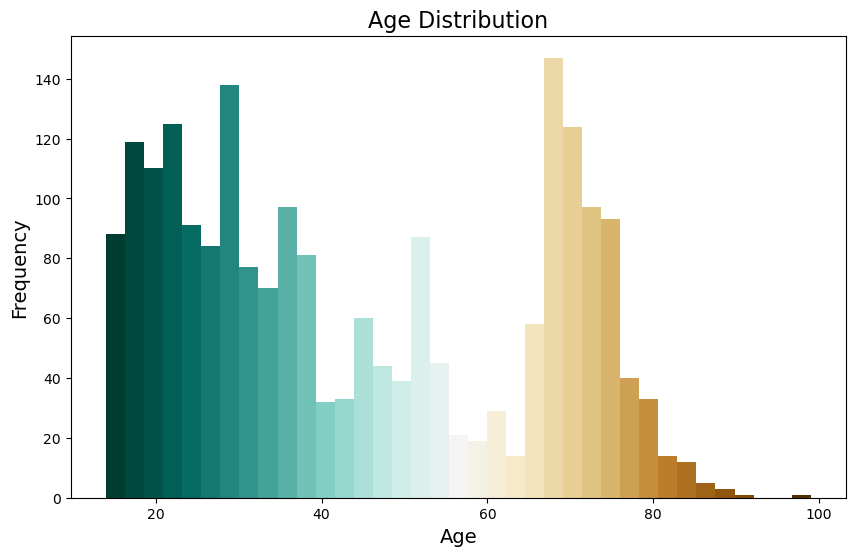

In [8]:
# Descriptive analytics
# I'm curious about some of the demographic statistics from the respondent pool
# I'd like to see what the breakdown is, and if there's anything I should adjust or transform based on these results

# Plot histogram of age distribution
plt.figure(figsize=(10,6))

# Color map
cm = plt.cm.get_cmap('BrBG_r')

plt.xlabel('Age', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.title('Age Distribution', fontsize=16)

n, bins, patches = plt.hist(gaming_df['Q1r1 - To begin, what is your age?'].astype(float), 37, color='blue')
bin_centers = 0.5 * (bins[:-1] + bins[1:])

# Scale values to interval [0,1]
col = bin_centers - min(bin_centers)
col /= max(col)

for c, p in zip(col, patches):
    plt.setp(p, 'facecolor', cm(c))
    
plt.show()

In [9]:
# Get gender counts
counts = gaming_df['Gender'].value_counts()
gender_df = pd.DataFrame(counts)
gender_df['percent'] = (gender_df['Gender'] /gender_df['Gender'].sum()) * 100

In [10]:
gender_df['percent']

Female    50.211168
Male      49.788832
Name: percent, dtype: float64

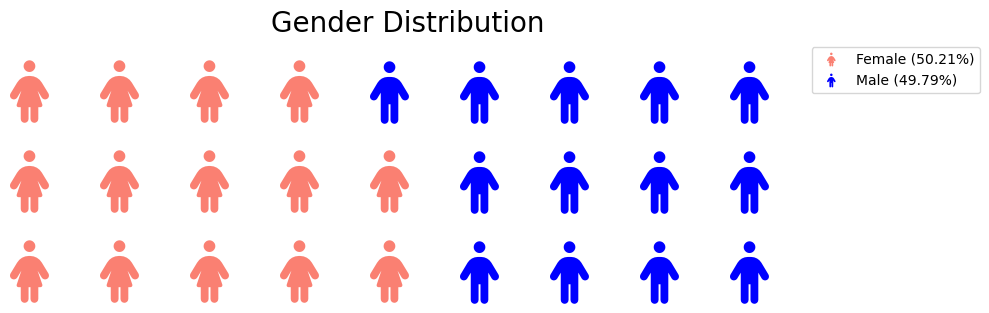

In [11]:
# To help me further understand the gender breakdown, I've created the following chart here
fig = plt.figure(
    FigureClass=pyw.Waffle, 
    rows=3, 
    columns = 9,
    values=gender_df['percent'], 
    colors=("#FA8072", "#0000FF"),
    title={'label': 'Gender Distribution', 'loc': 'center','size':20},
    labels=[f"{k} ({'{:.2f}'.format(v)}%)" for k, v in zip(gender_df.index, gender_df.percent)],
    legend={'loc': 'upper left', 'bbox_to_anchor': (1, 1)},
    icons=['female','male'], 
    icon_size=45, 
    icon_legend=True,
    figsize=(10, 8)
)

plt.show()

In [12]:
# Get regional counts
counts = gaming_df['Region'].value_counts()
region_df = pd.DataFrame(counts)
region_df['percent'] = (region_df['Region'] /region_df['Region'].sum())

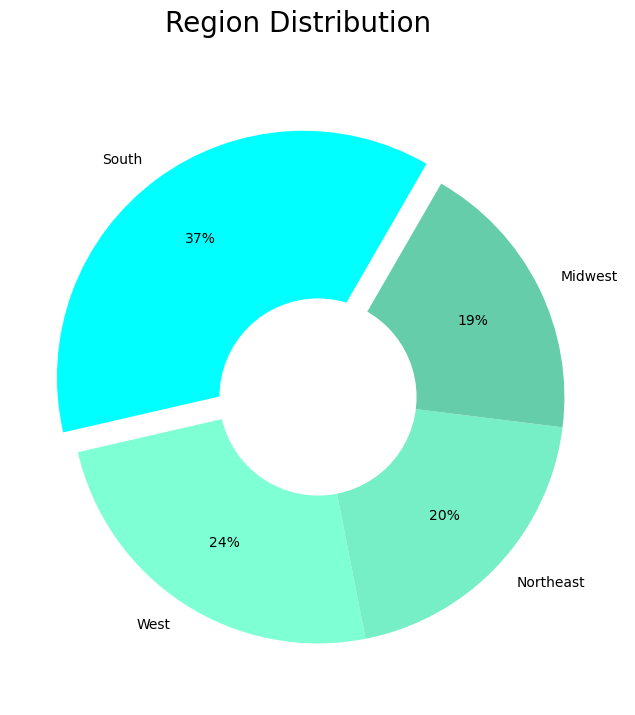

In [13]:
# Plot distribution
fig, ax  = plt.subplots(figsize=(16, 8))
fig.suptitle('Region Distribution', size = 20, color = 'black')
# Explode = (0.15, 0.15, 0.15, 0.15)
labels = ['South', 'West', 'Northeast', 'Midwest']
# Only explode the south, since it is the largest chunk
explode = (0.1,0,0,0)
sizes = region_df['percent']
colors = ['#00FFFF', '#7FFFD4', '#76EEC6', '#66CDAA']
ax.pie(sizes, explode=explode, startangle=60,colors = colors, labels=labels,autopct='%1.0f%%', pctdistance=0.7)
ax.add_artist(plt.Circle((0,0),0.4,fc='white'))
# Adjust the data label size
plt.rcParams['font.size'] = 15
plt.show()

import matplotlib.pyplot as plt



In [14]:
# Get employment counts
counts = gaming_df['QNEW3 - What is your employment status?'].value_counts()
status_df = pd.DataFrame(counts)
status_df['percent'] = (status_df['QNEW3 - What is your employment status?'] /status_df['QNEW3 - What is your employment status?'].sum())
status_df['percent'] 

Employed full-time or part-time    0.427499
Retired                            0.269357
Student                            0.122478
Unemployed                         0.110277
Self-employed                      0.070389
Name: percent, dtype: float64

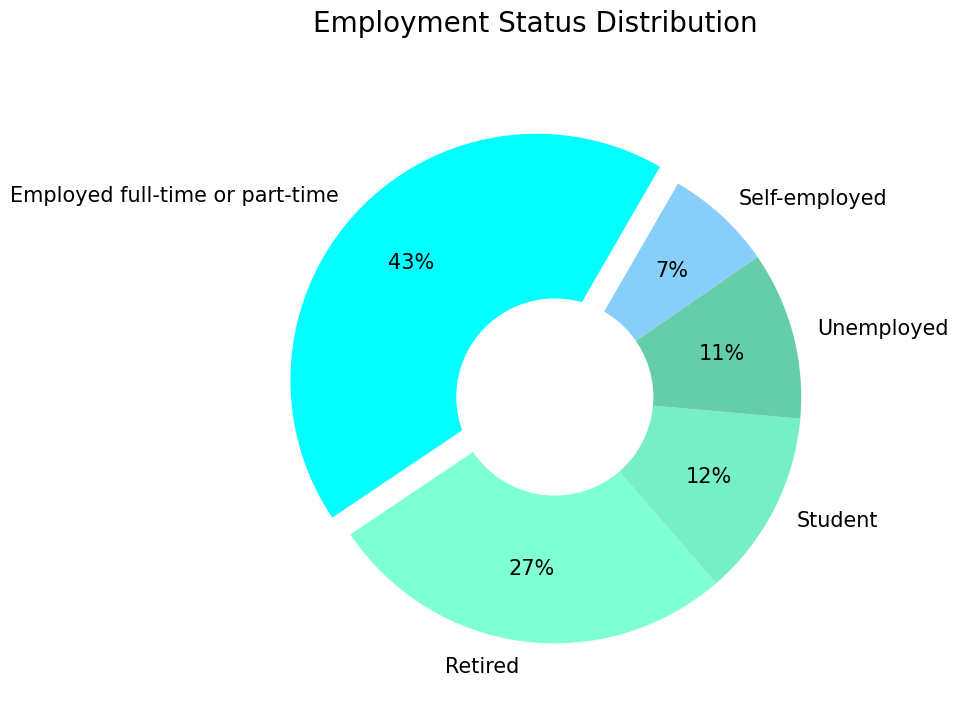

In [15]:
# Plot distribution
fig, ax  = plt.subplots(figsize=(16, 8))
fig.suptitle('Employment Status Distribution', size = 20, color = 'black')
labels = ['Employed full-time or part-time', 'Retired', 'Student','Unemployed','Self-employed']
sizes = status_df['percent']
# Only explode the employed full-time, since it is the largest chunk
explode = (0.1,0,0,0,0)
colors = ['#00FFFF', '#7FFFD4',  '#76EEC6', '#66CDAA','#87CEFA']
ax.pie(sizes, explode=explode, startangle=60,colors = colors, labels=labels,autopct='%1.0f%%', pctdistance=0.7)
ax.add_artist(plt.Circle((0,0),0.4,fc='white'))
# Adjust the data label size
plt.rcParams['font.size'] = 15
plt.show()

In [16]:
# Shorten label
gaming_df['Ethnicity'].replace('Pacific Islander (including Native Hawaiian, Native American, or Native Alaskan)', 'Pacific Islander & Related', inplace=True)

# Get ethnicity counts 
counts = gaming_df['Ethnicity'].value_counts()
eth_df = pd.DataFrame(counts)
eth_df['percent'] = (eth_df['Ethnicity'] /eth_df['Ethnicity'].sum())
eth_df['percent']

White or Caucasian (Non-Hispanic)           0.687001
African American                            0.125763
Hispanic                                    0.106992
Multiracial                                 0.020178
East Asian or Southeast Asian               0.019709
Caribbean                                   0.011732
Something else not listed here              0.009855
South Asian (India, Pakistan, Sri Lanka)    0.007039
Pacific Islander & Related                  0.007039
Middle Eastern                              0.004693
Name: percent, dtype: float64

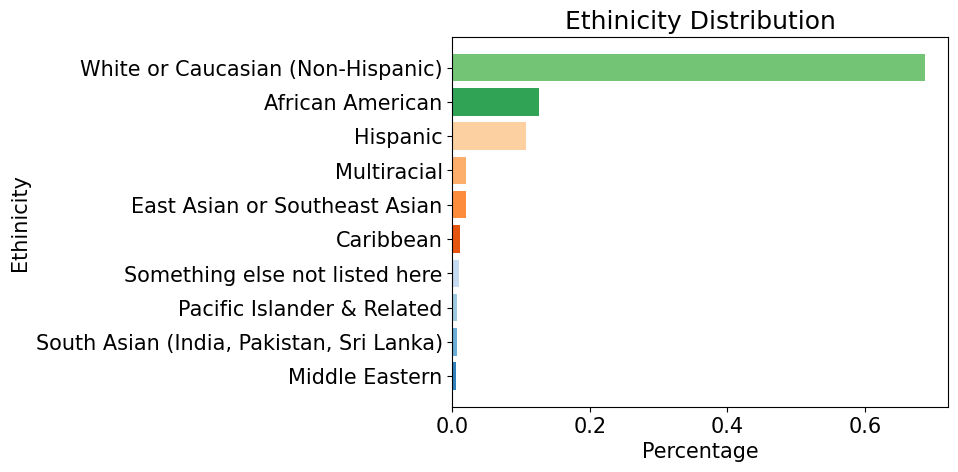

In [17]:
# Sort the dataframe 
eth_df.sort_values(by='percent', ascending=True, inplace=True)

# Create a color palette
palette = sns.color_palette("tab20c", len(eth_df['percent']))

# Create a horizontal bar plot
plt.barh(eth_df.index, eth_df['percent'], color=palette)

# Add labels and title
plt.title('Ethinicity Distribution')
plt.xlabel('Percentage')
plt.ylabel('Ethinicity')
plt.show()

In [18]:
# I want to be sure that there were no missing values here
# Count the missing values in the "Q5 - Which category best describes your ethnicity?" column

missing_values = gaming_df["Ethnicity"].isnull().sum()

print("Number of missing values:", missing_values)

Number of missing values: 0


In [19]:
gaming_df = gaming_df.replace("#NULL!", np.nan)

In [20]:
# I need to get a sense of how many missing values there are overall in this survey data set
missing_count = gaming_df.isna().sum()
missing_df = (pd.concat([missing_count.rename('Missing count'),
                     missing_count.div(len(gaming_df))
                          .rename('Missing ratio')],axis = 1)
             .loc[missing_count.ne(0)])

# Color the background of cells in a dataframe depending on the value of the data in each column 
missing_df.style.background_gradient(cmap="winter")

,Missing count,Missing ratio
Children 0-4 years,1270,0.595964
Children 5-9 years,1270,0.595964
Children 10-13 years,1270,0.595964
Children 14-18 years,1270,0.595964
Children 19-25 years,1270,0.595964
Children 26+years,1270,0.595964
QNEW2 - How old are the children in your home?-Dont Know,1270,0.595964
Value flat panel TV,1397,0.655561
Value Digital video recorder (DVR),1972,0.925387
Value Streaming media box or over-the-top,2021,0.948381


In [21]:
# There are notable amounts of columns that are missing data
# If the columns have too much missing data, then I really can't use them in the analysis
# It makes sense to get rid of columns that have more than 60% data missing, as imputing data won't capture true variance in these columns
gaming_df = gaming_df.drop(missing_df[missing_df['Missing ratio'] > 0.60].index, axis=1)

In [22]:
# I don't need these columns
gaming_df = gaming_df.drop('record - Record number', axis=1)
gaming_df = gaming_df.drop('FINAL WEIGHTS', axis=1)

In [23]:
missing_count1 = gaming_df.isna().sum()
missing_df1 = (pd.concat([missing_count1.rename('Missing count'),
                     missing_count1.div(len(gaming_df))
                          .rename('Missing ratio')],axis = 1)
             .loc[missing_count1.ne(0)])

# Color the background of cells in a dataframe depending on the value of the data in each column 
missing_df1.style.background_gradient(cmap="winter")


,Missing count,Missing ratio
Children 0-4 years,1270,0.595964
Children 5-9 years,1270,0.595964
Children 10-13 years,1270,0.595964
Children 14-18 years,1270,0.595964
Children 19-25 years,1270,0.595964
Children 26+years,1270,0.595964
QNEW2 - How old are the children in your home?-Dont Know,1270,0.595964
Value Laptop computer,1182,0.554669
Value Smartphone,961,0.450962
Types of apps used - Photo/video,658,0.308775


In [24]:
gaming_df.head()

,"Q1r1 - To begin, what is your age?",Gender,Age,State,Region,QNEW3 - What is your employment status?,Ethnicity,QNEW1 - Do you have children living in your home (excluding yourself if you are under 18)?,Children 0-4 years,Children 5-9 years,Children 10-13 years,Children 14-18 years,Children 19-25 years,Children 26+years,QNEW2 - How old are the children in your home?-Dont Know,Household_Income,Own Flat Panel TV,Own DVR,Own streaming media box or over-the-top box,Own Portable streaming thumb drive/fob,Own Over-the-air digital TV antenna (for free access to network broadcast without pay TV subscription),Own Blu-ray disc player/DVD player,Own Gaming console,Own Portable video game player,Own Computer network/router,Own Desktop computer,Own Laptop computer,Own Tablet,Own Dedicated e-book reader,Own Smartphone,Own Basic mobile phone,Own Smart watch,Own Fitness band,Own Virtual reality headset,Own Drone,Own None of the above,Dont Know,Purchase Flat panel in next 12 months,Purchase digital video recorder (DVR) in next 12 months,Purchase Streaming media box or over-the-top box in next 12 months,Purchase Portable streaming thumb drive/fob in next 12 months,Purchase Over the top digital TV antenna in next 12 months,Purchase Blu-ray disc player/DVD player in next 12 months,Purchase gaming console in next 12 months,Purchase Portable video game player in next 12 months,Purchase computer network/router in next 12 months,Purchase Desktop computer in next 12 months,Purchase Laptop Desktop computer in next 12 months,Purchase Tablet in next 12 months,Purchase Dedicated e-book reader in next 12 months,...,Subscriptions - Mobile voice,Subscriptions - Mobile data plan,Subscriptions - Streaming video service,Subscriptions - Streaming music service,Subscriptions - Gaming,Subscriptions - News/Newspaper(print or digital),Subscriptions - Magazine (print or digital),Subscriptions - None of the above,Subscriptions - Dont Know,Value the most - Pay TV,Value the most - Home Internet,Willing to pay to double download speed,Rank - Watching television,Rank - Using the Internet for social or personal interests,Movie Frequency - Rent a physical DVD/Blu-ray,Movie Frequency - Purchase a physical DVD/Blu-ray,Movie Frequency - Purchase digital video entertainment to download,Movie Frequency - Rent digital video entertainment to download,Movie Frequency - Watch digital video entertainment to download,Movie Frequency - Purchase/rent a video via TV service On-Demand PPV,TV Frequency - Rent a physical DVD/Blu-ray,TV Frequency - Purchase a physical DVD/Blu-ray,TV Frequency - Purchase digital video entertainment,TV Frequency - Watch digital video entertainment via an online streaming service,TV Frequency - Purchase/rent a video via your television on-demand or PPV,Do you binge-watch television shows - min of 3 episodes in a sitting,Frequency of using family or friend subscription log in,"When you use family or friend sub, what do you watch most often",Do during home TV viewing - Read for work/school,Do during home TV viewing - Read for pleasure,Do during home TV viewing - Browse and surf the Web,Do during home TV viewing - Microblogging,Do during home TV viewing - Read email,Do during home TV viewing - Write email,Do during home TV viewing - Text message,Do during home TV viewing - Use a social network,Do during home TV viewing - Talk on the phone,Do during home TV viewing - Browse for products and services online,Do during home TV viewing - Purchase products and services online,Do during home TV viewing - Play video games,I would rather pay for news online to avoid ads,I would rather pay for sports information online to avoid ads,I would rather pay for games online to avoid ads,I would rather pay for music online to avoid ads,I would rather pay for TV shows online to avoid ads,I would rather pay for movies online to avoid ads,I would rather provide more personal information online to receive targeted ads,By providing personal info online I may be a victim of identity thef

In [25]:
# I need to dummy code the follow variables
# One hot-encoding is selected for all variables where a value of 1 indicates the presence of that category
# and 0 indicates its absence
# It is suitable when there is no inherent order to the relationship between categories/no assumption of ordinality in the model

# Select the "Q4 - What is your gender?" variable from the DataFrame
gender_column = gaming_df['Gender']

# Perform one-hot encoding for the "Q4 - What is your gender?" variable
gender_encoded_data = pd.get_dummies(gender_column, prefix='Gender')

# Select the "Q5 - Which category best describes your ethnicity?" variable from the DataFrame
ethnicity_column = gaming_df['Ethnicity']

# Perform one-hot encoding for the "Q4 - What is your gender?" variable
ethnicity_encoded_data = pd.get_dummies(ethnicity_column, prefix='Ethnicity')

# Select the "region - Region" variable from the DataFrame
region_column = gaming_df['Region']

# Perform one-hot encoding for the "region - Region" variable
region_encoded_data = pd.get_dummies(region_column, prefix='Region')

# Select the "When you use family or friend sub, what do you watch most often" variable from the DataFrame
Subwatch_column = gaming_df['When you use family or friend sub, what do you watch most often']

# Perform one-hot encoding for the "Q5 - Which category best describes your ethnicity?" variable
Subwatch_encoded_data = pd.get_dummies(Subwatch_column, prefix='Sub Watch')

# Concatenate the encoded data with the original DataFrame
gaming_df_encoded = pd.concat([gaming_df, gender_encoded_data, ethnicity_encoded_data, region_encoded_data, Subwatch_encoded_data], axis=1)

# Print the resulting DataFrame
gaming_df_encoded


,"Q1r1 - To begin, what is your age?",Gender,Age,State,Region,QNEW3 - What is your employment status?,Ethnicity,QNEW1 - Do you have children living in your home (excluding yourself if you are under 18)?,Children 0-4 years,Children 5-9 years,Children 10-13 years,Children 14-18 years,Children 19-25 years,Children 26+years,QNEW2 - How old are the children in your home?-Dont Know,Household_Income,Own Flat Panel TV,Own DVR,Own streaming media box or over-the-top box,Own Portable streaming thumb drive/fob,Own Over-the-air digital TV antenna (for free access to network broadcast without pay TV subscription),Own Blu-ray disc player/DVD player,Own Gaming console,Own Portable video game player,Own Computer network/router,Own Desktop computer,Own Laptop computer,Own Tablet,Own Dedicated e-book reader,Own Smartphone,Own Basic mobile phone,Own Smart watch,Own Fitness band,Own Virtual reality headset,Own Drone,Own None of the above,Dont Know,Purchase Flat panel in next 12 months,Purchase digital video recorder (DVR) in next 12 months,Purchase Streaming media box or over-the-top box in next 12 months,Purchase Portable streaming thumb drive/fob in next 12 months,Purchase Over the top digital TV antenna in next 12 months,Purchase Blu-ray disc player/DVD player in next 12 months,Purchase gaming console in next 12 months,Purchase Portable video game player in next 12 months,Purchase computer network/router in next 12 months,Purchase Desktop computer in next 12 months,Purchase Laptop Desktop computer in next 12 months,Purchase Tablet in next 12 months,Purchase Dedicated e-book reader in next 12 months,...,Movie Frequency - Purchase/rent a video via TV service On-Demand PPV,TV Frequency - Rent a physical DVD/Blu-ray,TV Frequency - Purchase a physical DVD/Blu-ray,TV Frequency - Purchase digital video entertainment,TV Frequency - Watch digital video entertainment via an online streaming service,TV Frequency - Purchase/rent a video via your television on-demand or PPV,Do you binge-watch television shows - min of 3 episodes in a sitting,Frequency of using family or friend subscription log in,"When you use family or friend sub, what do you watch most often",Do during home TV viewing - Read for work/school,Do during home TV viewing - Read for pleasure,Do during home TV viewing - Browse and surf the Web,Do during home TV viewing - Microblogging,Do during home TV viewing - Read email,Do during home TV viewing - Write email,Do during home TV viewing - Text message,Do during home TV viewing - Use a social network,Do during home TV viewing - Talk on the phone,Do during home TV viewing - Browse for products and services online,Do during home TV viewing - Purchase products and services online,Do during home TV viewing - Play video games,I would rather pay for news online to avoid ads,I would rather pay for sports information online to avoid ads,I would rather pay for games online to avoid ads,I would rather pay for music online to avoid ads,I would rather pay for TV shows online to avoid ads,I would rather pay for movies online to avoid ads,I would rather provide more personal information online to receive targeted ads,By providing personal info online I may be a victim of identity theft,I would be willing to view ads if it cut sub cost,How do you get news,Gender_Female,Gender_Male,Ethnicity_African American,Ethnicity_Caribbean,Ethnicity_East Asian or Southeast Asian,Ethnicity_Hispanic,Ethnicity_Middle Eastern,Ethnicity_Multiracial,Ethnicity_Pacific Islander & Related,Ethnicity_Something else not listed here,"Ethnicity_South Asian (India, Pakistan, Sri Lanka)",Ethnicity_White or Caucasian (Non-Hispanic),Region_Midwest,Region_Northeast,Region_South,Region_West,Sub Watch_Movies,Sub Watch_Sporting events,Sub Watch_Television programming
0,36,Male,34-50,Georgia,South,Employed full-time or part-time,White or Caucasian (Non-Hispanic),1,0.0,0.0,1.0,1.0,0.0,0.0,0.0,"$50,000 to $99,999",0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,...,4,4,4,4,4,4

In [26]:
# Dealing with NaN values
total_nan_values = gaming_df_encoded.isna().sum().sum()
print(total_nan_values)

nan_counts = gaming_df_encoded.isna().sum()
print(nan_counts)


40898
Q1r1 - To begin, what is your age?                                                                                                                    0
Gender                                                                                                                                                0
Age                                                                                                                                                   0
State                                                                                                                                                 0
Region                                                                                                                                                0
QNEW3 - What is your employment status?                                                                                                               0
Ethnicity                                                                         

In [27]:
# How many observations in Deloitte
total_observations = gaming_df_encoded.shape[0]
print(total_observations)


2131


In [28]:
# There are still missing values to deal with here
# For missing values in categorical columns, it makes sense to use mode rather than mean to fill them
# Find the mode for each categorical column
mode_values = gaming_df_encoded.mode().iloc[0]

# Fill NaN values in categorical columns with mode values
categorical_columns = gaming_df_encoded.select_dtypes(include='object').columns
gaming_df_encoded[categorical_columns] = gaming_df_encoded[categorical_columns].fillna(mode_values)

# Differently for numerical columns,it makes sense to use mean values to fill in missing values
# Fill NaN values in numerical columns with mean values
numerical_columns = gaming_df_encoded.select_dtypes(include=['float', 'int']).columns
mean_values = gaming_df_encoded[numerical_columns].mean()
gaming_df_encoded[numerical_columns] = gaming_df_encoded[numerical_columns].fillna(mean_values)


In [29]:
# For the remaining variables that have not been coded, but need to be, I'll need to use one-label encoder, as they are not categorical variables
# First, I need to see what the breakdowns are for some of them, as I'll need to underestand what the lowest value reponse is through the highest value response

# Get household income counts
counts = gaming_df['Household_Income'].value_counts()
status_df = pd.DataFrame(counts)
status_df['percent'] = (status_df['Household_Income'] /status_df['Household_Income'].sum())
status_df['percent'] 


$50,000 to $99,999      0.345847
Less than $29,999       0.212576
$30,000 to $49,999      0.199906
$100,000 to $299,999    0.174097
Do not know             0.056312
More than $300,000      0.011262
Name: percent, dtype: float64

In [30]:
# Get pay to double speed counts
counts = gaming_df_encoded['Willing to pay to double download speed'].value_counts()
status_df = pd.DataFrame(counts)
status_df['percent'] = (status_df['Willing to pay to double download speed'] /status_df['Willing to pay to double download speed'].sum())
status_df['percent'] 

I am not willing to pay more for faster download speeds as my current speed is sufficient for my needs    0.486626
I prefer faster speed but I am unwilling to pay more than I already do                                    0.164242
I am willing to pay $5 per month on top of what I already pay                                             0.140310
I am willing to pay $10 per month on top of what I already pay                                            0.115439
I am willing to pay $20 per month on top of what I already pay                                            0.053965
I am willing to pay $30 or more per month on top of what I already pay                                    0.039418
Name: percent, dtype: float64

In [31]:
# Label Encoder using replace () method
# This is used for converting each variable response into a unique coded response
# It is often used when a variable has an inherent ordinal/interval relationship
# It is useful particularly when building models that can directly interpret the encoded values 

# Replace method for Household Income
encoding_mapping = {
    "Less than $29,999": 1,
    "$30,000 to $49,999": 2,
    "$50,000 to $99,999": 3,
    "$100,000 to $299,999": 4,
    "More than $300,000": 5,
    "Do not know": -999,
}
# I'll be sure to drop the -999 values, but for now, this will enable to me to code what I won't need in the future
# This will make dropping answer choices easier for myself

# Perform label encoding using the specified mapping
gaming_df_encoded["Household_Income"] = gaming_df_encoded["Household_Income"].replace(encoding_mapping)


# Replace method for QNEW3 - What is your employment status?
encoding_mapping = {
    "Retired": 0,
    "Unemployed": 1,
    "Student": 2,
    "Self-employed": 3,
    "Employed full-time or part-time": 4
}

# Perform label encoding using the specified mapping
gaming_df_encoded["QNEW3 - What is your employment status?"] = gaming_df_encoded["QNEW3 - What is your employment status?"].replace(encoding_mapping)


# Replace method for pay to double Internet speed
encoding_mapping = {
    "I am not willing to pay more for faster download speeds as my current speed is sufficient for my needs": 1,
    "I prefer faster speed but I am unwilling to pay more than I already do": 2,
    "I am willing to pay $5 per month on top of what I already pay": 3,
    "I am willing to pay $10 per month on top of what I already pay": 4,
    "I am willing to pay $20 per month on top of what I already pay": 5,
    "I am willing to pay $30 or more per month on top of what I already pay": 6,
    
}

# Perform label encoding using the specified mapping
gaming_df_encoded["Willing to pay to double download speed"] = gaming_df_encoded["Willing to pay to double download speed"].replace(encoding_mapping)



In [32]:
gaming_df_encoded

,"Q1r1 - To begin, what is your age?",Gender,Age,State,Region,QNEW3 - What is your employment status?,Ethnicity,QNEW1 - Do you have children living in your home (excluding yourself if you are under 18)?,Children 0-4 years,Children 5-9 years,Children 10-13 years,Children 14-18 years,Children 19-25 years,Children 26+years,QNEW2 - How old are the children in your home?-Dont Know,Household_Income,Own Flat Panel TV,Own DVR,Own streaming media box or over-the-top box,Own Portable streaming thumb drive/fob,Own Over-the-air digital TV antenna (for free access to network broadcast without pay TV subscription),Own Blu-ray disc player/DVD player,Own Gaming console,Own Portable video game player,Own Computer network/router,Own Desktop computer,Own Laptop computer,Own Tablet,Own Dedicated e-book reader,Own Smartphone,Own Basic mobile phone,Own Smart watch,Own Fitness band,Own Virtual reality headset,Own Drone,Own None of the above,Dont Know,Purchase Flat panel in next 12 months,Purchase digital video recorder (DVR) in next 12 months,Purchase Streaming media box or over-the-top box in next 12 months,Purchase Portable streaming thumb drive/fob in next 12 months,Purchase Over the top digital TV antenna in next 12 months,Purchase Blu-ray disc player/DVD player in next 12 months,Purchase gaming console in next 12 months,Purchase Portable video game player in next 12 months,Purchase computer network/router in next 12 months,Purchase Desktop computer in next 12 months,Purchase Laptop Desktop computer in next 12 months,Purchase Tablet in next 12 months,Purchase Dedicated e-book reader in next 12 months,...,Movie Frequency - Purchase/rent a video via TV service On-Demand PPV,TV Frequency - Rent a physical DVD/Blu-ray,TV Frequency - Purchase a physical DVD/Blu-ray,TV Frequency - Purchase digital video entertainment,TV Frequency - Watch digital video entertainment via an online streaming service,TV Frequency - Purchase/rent a video via your television on-demand or PPV,Do you binge-watch television shows - min of 3 episodes in a sitting,Frequency of using family or friend subscription log in,"When you use family or friend sub, what do you watch most often",Do during home TV viewing - Read for work/school,Do during home TV viewing - Read for pleasure,Do during home TV viewing - Browse and surf the Web,Do during home TV viewing - Microblogging,Do during home TV viewing - Read email,Do during home TV viewing - Write email,Do during home TV viewing - Text message,Do during home TV viewing - Use a social network,Do during home TV viewing - Talk on the phone,Do during home TV viewing - Browse for products and services online,Do during home TV viewing - Purchase products and services online,Do during home TV viewing - Play video games,I would rather pay for news online to avoid ads,I would rather pay for sports information online to avoid ads,I would rather pay for games online to avoid ads,I would rather pay for music online to avoid ads,I would rather pay for TV shows online to avoid ads,I would rather pay for movies online to avoid ads,I would rather provide more personal information online to receive targeted ads,By providing personal info online I may be a victim of identity theft,I would be willing to view ads if it cut sub cost,How do you get news,Gender_Female,Gender_Male,Ethnicity_African American,Ethnicity_Caribbean,Ethnicity_East Asian or Southeast Asian,Ethnicity_Hispanic,Ethnicity_Middle Eastern,Ethnicity_Multiracial,Ethnicity_Pacific Islander & Related,Ethnicity_Something else not listed here,"Ethnicity_South Asian (India, Pakistan, Sri Lanka)",Ethnicity_White or Caucasian (Non-Hispanic),Region_Midwest,Region_Northeast,Region_South,Region_West,Sub Watch_Movies,Sub Watch_Sporting events,Sub Watch_Television programming
0,36,Male,34-50,Georgia,South,4,White or Caucasian (Non-Hispanic),1,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.0,3,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,...,4,4,4,4,4,4,1,4,Television pro

In [33]:

print(gaming_df_encoded.columns.tolist())



['Q1r1 - To begin, what is your age?', 'Gender', 'Age', 'State', 'Region', 'QNEW3 - What is your employment status?', 'Ethnicity', 'QNEW1 - Do you have children living in your home (excluding yourself if you are under 18)?', 'Children 0-4 years', 'Children 5-9 years', 'Children 10-13 years', 'Children 14-18 years', 'Children 19-25 years', 'Children 26+years', 'QNEW2 - How old are the children in your home?-Dont Know', 'Household_Income', 'Own Flat Panel TV', 'Own DVR', 'Own streaming media box or over-the-top box', 'Own Portable streaming thumb drive/fob', 'Own Over-the-air digital TV antenna (for free access to network broadcast without pay TV subscription)', 'Own Blu-ray disc player/DVD player', 'Own Gaming console', 'Own Portable video game player', 'Own Computer network/router', 'Own Desktop computer', 'Own Laptop computer', 'Own Tablet', 'Own Dedicated e-book reader', 'Own Smartphone', 'Own Basic mobile phone', 'Own Smart watch', 'Own Fitness band', 'Own Virtual reality headset', 

In [34]:
# The -999 responses are not useful in this data set
# Drop rows with -999 values
gaming_df_encoded = gaming_df_encoded[~(gaming_df_encoded == -999).any(axis=1)]



In [35]:
# Since subscribing to video or television is broadly embraced by consumers, its likely that demographic information will not be useful 
# There are also questions that are not relevant or share variance with the dependent variable
# Drop columns that are no longer needed
columns_to_drop = ['Gender', 'Region', 'Age', 'State', 'Ethnicity',"QNEW2 - How old are the children in your home?-Dont Know", "How do you get news", "When you use family or friend sub, what do you watch most often"]
gaming_df_encoded = gaming_df_encoded.drop(columns=columns_to_drop)

In [36]:
# I want to be sure that this was processed properly, and there are no other issues to clear up
# Univariate statistics

gaming_df_encoded.describe()

,"Q1r1 - To begin, what is your age?",QNEW3 - What is your employment status?,QNEW1 - Do you have children living in your home (excluding yourself if you are under 18)?,Children 0-4 years,Children 5-9 years,Children 10-13 years,Children 14-18 years,Children 19-25 years,Children 26+years,Household_Income,Own Flat Panel TV,Own DVR,Own streaming media box or over-the-top box,Own Portable streaming thumb drive/fob,Own Over-the-air digital TV antenna (for free access to network broadcast without pay TV subscription),Own Blu-ray disc player/DVD player,Own Gaming console,Own Portable video game player,Own Computer network/router,Own Desktop computer,Own Laptop computer,Own Tablet,Own Dedicated e-book reader,Own Smartphone,Own Basic mobile phone,Own Smart watch,Own Fitness band,Own Virtual reality headset,Own Drone,Own None of the above,Dont Know,Purchase Flat panel in next 12 months,Purchase digital video recorder (DVR) in next 12 months,Purchase Streaming media box or over-the-top box in next 12 months,Purchase Portable streaming thumb drive/fob in next 12 months,Purchase Over the top digital TV antenna in next 12 months,Purchase Blu-ray disc player/DVD player in next 12 months,Purchase gaming console in next 12 months,Purchase Portable video game player in next 12 months,Purchase computer network/router in next 12 months,Purchase Desktop computer in next 12 months,Purchase Laptop Desktop computer in next 12 months,Purchase Tablet in next 12 months,Purchase Dedicated e-book reader in next 12 months,Purchase Smartphone in next 12 months,Purchase Basic moblie phone in next 12 months,Purchase Smart watch in next 12 months,Purchase Fitness band in next 12 months,Purchase Virtual reality headset in next 12 months,Purchase Drone in next 12 months,...,Movie Frequency - Rent digital video entertainment to download,Movie Frequency - Watch digital video entertainment to download,Movie Frequency - Purchase/rent a video via TV service On-Demand PPV,TV Frequency - Rent a physical DVD/Blu-ray,TV Frequency - Purchase a physical DVD/Blu-ray,TV Frequency - Purchase digital video entertainment,TV Frequency - Watch digital video entertainment via an online streaming service,TV Frequency - Purchase/rent a video via your television on-demand or PPV,Do you binge-watch television shows - min of 3 episodes in a sitting,Frequency of using family or friend subscription log in,Do during home TV viewing - Read for work/school,Do during home TV viewing - Read for pleasure,Do during home TV viewing - Browse and surf the Web,Do during home TV viewing - Microblogging,Do during home TV viewing - Read email,Do during home TV viewing - Write email,Do during home TV viewing - Text message,Do during home TV viewing - Use a social network,Do during home TV viewing - Talk on the phone,Do during home TV viewing - Browse for products and services online,Do during home TV viewing - Purchase products and services online,Do during home TV viewing - Play video games,I would rather pay for news online to avoid ads,I would rather pay for sports information online to avoid ads,I would rather pay for games online to avoid ads,I would rather pay for music online to avoid ads,I would rather pay for TV shows online to avoid ads,I would rather pay for movies online to avoid ads,I would rather provide more personal information online to receive targeted ads,By providing personal info online I may be a victim of identity theft,I would be willing to view ads if it cut sub cost,Gender_Female,Gender_Male,Ethnicity_African American,Ethnicity_Caribbean,Ethnicity_East Asian or Southeast Asian,Ethnicity_Hispanic,Ethnicity_Middle Eastern,Ethnicity_Multiracial,Ethnicity_Pacific Islander & Related,Ethnicity_Something else not listed here,"Ethnicity_South Asian (India, Pakistan, Sri Lanka)",Ethnicity_White or Caucasian (Non-Hispanic),Region_Midwest,Region_Northeast,Region_South,Region_West,Sub Watch_Movies,Sub Watch_Sporting events,Sub Watch_Television programming
count,1209.000000,1209.000000,120

In [37]:
gaming_df_encoded

,"Q1r1 - To begin, what is your age?",QNEW3 - What is your employment status?,QNEW1 - Do you have children living in your home (excluding yourself if you are under 18)?,Children 0-4 years,Children 5-9 years,Children 10-13 years,Children 14-18 years,Children 19-25 years,Children 26+years,Household_Income,Own Flat Panel TV,Own DVR,Own streaming media box or over-the-top box,Own Portable streaming thumb drive/fob,Own Over-the-air digital TV antenna (for free access to network broadcast without pay TV subscription),Own Blu-ray disc player/DVD player,Own Gaming console,Own Portable video game player,Own Computer network/router,Own Desktop computer,Own Laptop computer,Own Tablet,Own Dedicated e-book reader,Own Smartphone,Own Basic mobile phone,Own Smart watch,Own Fitness band,Own Virtual reality headset,Own Drone,Own None of the above,Dont Know,Purchase Flat panel in next 12 months,Purchase digital video recorder (DVR) in next 12 months,Purchase Streaming media box or over-the-top box in next 12 months,Purchase Portable streaming thumb drive/fob in next 12 months,Purchase Over the top digital TV antenna in next 12 months,Purchase Blu-ray disc player/DVD player in next 12 months,Purchase gaming console in next 12 months,Purchase Portable video game player in next 12 months,Purchase computer network/router in next 12 months,Purchase Desktop computer in next 12 months,Purchase Laptop Desktop computer in next 12 months,Purchase Tablet in next 12 months,Purchase Dedicated e-book reader in next 12 months,Purchase Smartphone in next 12 months,Purchase Basic moblie phone in next 12 months,Purchase Smart watch in next 12 months,Purchase Fitness band in next 12 months,Purchase Virtual reality headset in next 12 months,Purchase Drone in next 12 months,...,Movie Frequency - Rent digital video entertainment to download,Movie Frequency - Watch digital video entertainment to download,Movie Frequency - Purchase/rent a video via TV service On-Demand PPV,TV Frequency - Rent a physical DVD/Blu-ray,TV Frequency - Purchase a physical DVD/Blu-ray,TV Frequency - Purchase digital video entertainment,TV Frequency - Watch digital video entertainment via an online streaming service,TV Frequency - Purchase/rent a video via your television on-demand or PPV,Do you binge-watch television shows - min of 3 episodes in a sitting,Frequency of using family or friend subscription log in,Do during home TV viewing - Read for work/school,Do during home TV viewing - Read for pleasure,Do during home TV viewing - Browse and surf the Web,Do during home TV viewing - Microblogging,Do during home TV viewing - Read email,Do during home TV viewing - Write email,Do during home TV viewing - Text message,Do during home TV viewing - Use a social network,Do during home TV viewing - Talk on the phone,Do during home TV viewing - Browse for products and services online,Do during home TV viewing - Purchase products and services online,Do during home TV viewing - Play video games,I would rather pay for news online to avoid ads,I would rather pay for sports information online to avoid ads,I would rather pay for games online to avoid ads,I would rather pay for music online to avoid ads,I would rather pay for TV shows online to avoid ads,I would rather pay for movies online to avoid ads,I would rather provide more personal information online to receive targeted ads,By providing personal info online I may be a victim of identity theft,I would be willing to view ads if it cut sub cost,Gender_Female,Gender_Male,Ethnicity_African American,Ethnicity_Caribbean,Ethnicity_East Asian or Southeast Asian,Ethnicity_Hispanic,Ethnicity_Middle Eastern,Ethnicity_Multiracial,Ethnicity_Pacific Islander & Related,Ethnicity_Something else not listed here,"Ethnicity_South Asian (India, Pakistan, Sri Lanka)",Ethnicity_White or Caucasian (Non-Hispanic),Region_Midwest,Region_Northeast,Region_South,Region_West,Sub Watch_Movies,Sub Watch_Sporting events,Sub Watch_Television programming
0,36,4,1,0.000000,0.000000,1.0000

In [38]:
# I want to do one final check for NaNs
# Check for NaN values in gaming_df_encoded
has_nan = gaming_df_encoded.isnull().any().any()

if has_nan:
    print("There are remaining NaN values in gaming_df_encoded.")
else:
    print("There are no remaining NaN values in gaming_df_encoded.")


There are no remaining NaN values in gaming_df_encoded.


In [39]:
# I'd like to look at descriptions for floats and categorical variables
# Describe floats
# Describe float variables
float_variables = gaming_df_encoded.select_dtypes(include='float')
description = float_variables.describe()

description


,Children 0-4 years,Children 5-9 years,Children 10-13 years,Children 14-18 years,Children 19-25 years,Children 26+years,Types of apps used - Photo/video,Types of apps used - Banking,Types of apps used - Fitness/health,Types of apps used - Food/drink,Types of apps used - Retail/shopping,Types of apps used - Navigation,Types of apps used - Social networks,Types of apps used - Reading books,Types of apps used - Streaming music,Types of apps used - Streaming video,Types of apps used - Reviews/guides,Types of apps used - News consolidator,Types of apps used - Newspaper/news broadcaster,Types of apps used - Magazines,Types of apps used - Diagnostic/utilities,Types of apps used - QR Reader,Types of apps used - Travel,Types of apps used - Transportation,Types of apps used - Location,Types of apps used - Language,Types of apps used - Movie,Types of apps used - Business,Types of apps used - Games,Types of apps used - Productivity,Types of apps used - Sports,Types of apps used - Weather,Types of apps used - Browser,Types of apps used - VOIP,Types of apps used - Dating,Types of apps used - Messaging,Types of apps used - Mobile payment,Types of apps used - Education,Types of apps used - Tickets,Types of apps used - Reservations,Types of apps used - Special interest/Hobby apps,Types of apps used - None,Types of apps used - Dont Know
count,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.000000,1209.0
mean,0.340226,0.425867,0.362173,0.367877,0.045778,0.025503,0.303582,0.393210,0.223172,0.165418,0.361382,0.347592,0.598822,0.181573,0.427720,0.371617,0.138119,0.105499,0.239879,0.116804,0.108494,0.067050,0.153285,0.153088,0.143557,0.148481,0.204303,0.076937,0.408376,0.127285,0.282183,0.438251,0.467989,0.055664,0.084856,0.324700,0.239366,0.118814,0.084067,0.069098,0.184174,0.067532,0.0
std,0.346655,0.361893,0.351393,0.350416,0.141209,0.110144,0.392236,0.413723,0.360226,0.324170,0.405724,0.402895,0.411952,0.331717,0.418677,0.411510,0.298620,0.268413,0.364952,0.282318,0.269469,0.218362,0.312792,0.312810,0.301406,0.306183,0.347816,0.235481,0.416508,0.288439,0.390422,0.417441,0.420694,0.203114,0.243933,0.397928,0.366290,0.283324,0.243993,0.221590,0.332391,0.196245,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
50%,0.333333,0.409988,0.355401,0.372822,0.000000,0.000000,0.273591,0.368635,0.000000,0.000000,0.353021,0.334012,0.581127,0.000000,0.399185,0.331297,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.378140,0.000000,0.222675,0.458248,0.460964,0.000000,0.000000,0.300747,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
75%,0.333333,0.409988,0.355401,0.372822,0.053426,0.027875,0.273591,1.000000,0.184657,0.131025,1.000000,1.000000,1.000000,0.158181,1.000000,1.000000,0.116768,0.084182,0.216565,0.088934,0.091650,0.054311,0.126273,

In [40]:
# I'd like to see what the counts are for objects
# Describe string variables
string_variables = gaming_df_encoded.select_dtypes(include='object')
description1 = string_variables.describe()
description1


,Value Laptop computer,Value Smartphone,Value the most - Pay TV,Value the most - Home Internet,Rank - Watching television,Rank - Using the Internet for social or personal interests
count,1209,1209,1209,1209,1209,1209
unique,3,3,3,3,3,3
top,1,1,1,1,1,2
freq,890,880,881,877,822,786


In [41]:
gaming_df_encoded

,"Q1r1 - To begin, what is your age?",QNEW3 - What is your employment status?,QNEW1 - Do you have children living in your home (excluding yourself if you are under 18)?,Children 0-4 years,Children 5-9 years,Children 10-13 years,Children 14-18 years,Children 19-25 years,Children 26+years,Household_Income,Own Flat Panel TV,Own DVR,Own streaming media box or over-the-top box,Own Portable streaming thumb drive/fob,Own Over-the-air digital TV antenna (for free access to network broadcast without pay TV subscription),Own Blu-ray disc player/DVD player,Own Gaming console,Own Portable video game player,Own Computer network/router,Own Desktop computer,Own Laptop computer,Own Tablet,Own Dedicated e-book reader,Own Smartphone,Own Basic mobile phone,Own Smart watch,Own Fitness band,Own Virtual reality headset,Own Drone,Own None of the above,Dont Know,Purchase Flat panel in next 12 months,Purchase digital video recorder (DVR) in next 12 months,Purchase Streaming media box or over-the-top box in next 12 months,Purchase Portable streaming thumb drive/fob in next 12 months,Purchase Over the top digital TV antenna in next 12 months,Purchase Blu-ray disc player/DVD player in next 12 months,Purchase gaming console in next 12 months,Purchase Portable video game player in next 12 months,Purchase computer network/router in next 12 months,Purchase Desktop computer in next 12 months,Purchase Laptop Desktop computer in next 12 months,Purchase Tablet in next 12 months,Purchase Dedicated e-book reader in next 12 months,Purchase Smartphone in next 12 months,Purchase Basic moblie phone in next 12 months,Purchase Smart watch in next 12 months,Purchase Fitness band in next 12 months,Purchase Virtual reality headset in next 12 months,Purchase Drone in next 12 months,...,Movie Frequency - Rent digital video entertainment to download,Movie Frequency - Watch digital video entertainment to download,Movie Frequency - Purchase/rent a video via TV service On-Demand PPV,TV Frequency - Rent a physical DVD/Blu-ray,TV Frequency - Purchase a physical DVD/Blu-ray,TV Frequency - Purchase digital video entertainment,TV Frequency - Watch digital video entertainment via an online streaming service,TV Frequency - Purchase/rent a video via your television on-demand or PPV,Do you binge-watch television shows - min of 3 episodes in a sitting,Frequency of using family or friend subscription log in,Do during home TV viewing - Read for work/school,Do during home TV viewing - Read for pleasure,Do during home TV viewing - Browse and surf the Web,Do during home TV viewing - Microblogging,Do during home TV viewing - Read email,Do during home TV viewing - Write email,Do during home TV viewing - Text message,Do during home TV viewing - Use a social network,Do during home TV viewing - Talk on the phone,Do during home TV viewing - Browse for products and services online,Do during home TV viewing - Purchase products and services online,Do during home TV viewing - Play video games,I would rather pay for news online to avoid ads,I would rather pay for sports information online to avoid ads,I would rather pay for games online to avoid ads,I would rather pay for music online to avoid ads,I would rather pay for TV shows online to avoid ads,I would rather pay for movies online to avoid ads,I would rather provide more personal information online to receive targeted ads,By providing personal info online I may be a victim of identity theft,I would be willing to view ads if it cut sub cost,Gender_Female,Gender_Male,Ethnicity_African American,Ethnicity_Caribbean,Ethnicity_East Asian or Southeast Asian,Ethnicity_Hispanic,Ethnicity_Middle Eastern,Ethnicity_Multiracial,Ethnicity_Pacific Islander & Related,Ethnicity_Something else not listed here,"Ethnicity_South Asian (India, Pakistan, Sri Lanka)",Ethnicity_White or Caucasian (Non-Hispanic),Region_Midwest,Region_Northeast,Region_South,Region_West,Sub Watch_Movies,Sub Watch_Sporting events,Sub Watch_Television programming
0,36,4,1,0.000000,0.000000,1.0000

                                                    Q1r1 - To begin, what is your age?  \
Q1r1 - To begin, what is your age?                                            1.000000   
QNEW3 - What is your employment status?                                      -0.474531   
QNEW1 - Do you have children living in your hom...                           -0.348072   
Children 0-4 years                                                           -0.112554   
Children 5-9 years                                                           -0.036999   
Children 10-13 years                                                          0.019654   
Children 14-18 years                                                          0.054498   
Children 19-25 years                                                          0.087753   
Children 26+years                                                             0.125712   
Household_Income                                                             -0.051244   
Own Flat P

<Axes: >

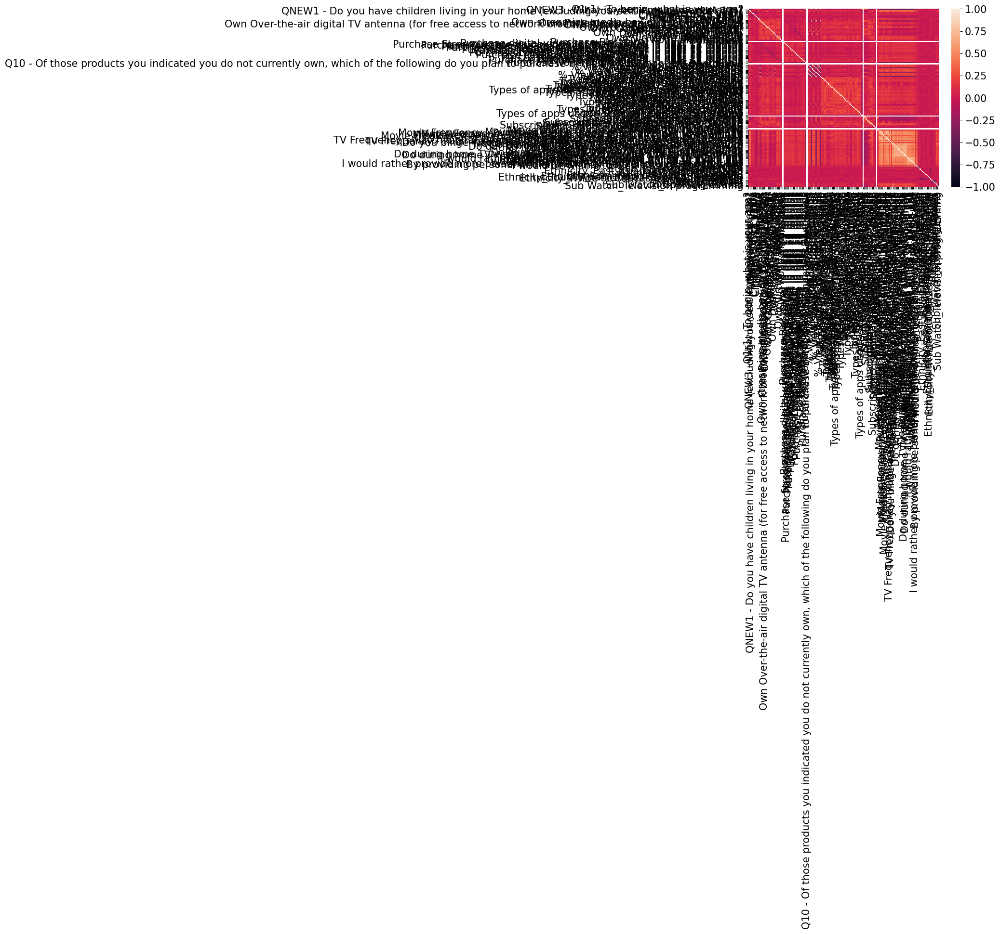

In [42]:
# Are there any correlations I should be mindful of here?
# Find correlations here and produce a heatmap
corr = gaming_df_encoded.corr()
print(corr)
sns.heatmap(corr,
           xticklabels=corr.columns,
           yticklabels=corr.columns)


In [43]:
# Compute the correlation matrix
correlation_matrix = gaming_df_encoded.corr()

# Set threshold for correlation coefficient
threshold = 0.7

# Identify highly correlated features
highly_correlated_features = set()
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > threshold:
            colname_i = correlation_matrix.columns[i]
            colname_j = correlation_matrix.columns[j]
            highly_correlated_features.add(colname_i)
            highly_correlated_features.add(colname_j)

# Remove highly correlated features from the dataset
selected_features = gaming_df_encoded.drop(highly_correlated_features, axis=1)



In [44]:
# Calculate the correlation matrix
correlation_matrix = gaming_df_encoded.corr()

# Select features with correlation above a certain threshold
correlation_threshold = 0.7  # Adjust the threshold as needed
selected_features = correlation_matrix[abs(correlation_matrix['Subscriptions - Streaming video service']) > correlation_threshold].index.tolist()

correlation_matrix

,"Q1r1 - To begin, what is your age?",QNEW3 - What is your employment status?,QNEW1 - Do you have children living in your home (excluding yourself if you are under 18)?,Children 0-4 years,Children 5-9 years,Children 10-13 years,Children 14-18 years,Children 19-25 years,Children 26+years,Household_Income,Own Flat Panel TV,Own DVR,Own streaming media box or over-the-top box,Own Portable streaming thumb drive/fob,Own Over-the-air digital TV antenna (for free access to network broadcast without pay TV subscription),Own Blu-ray disc player/DVD player,Own Gaming console,Own Portable video game player,Own Computer network/router,Own Desktop computer,Own Laptop computer,Own Tablet,Own Dedicated e-book reader,Own Smartphone,Own Basic mobile phone,Own Smart watch,Own Fitness band,Own Virtual reality headset,Own Drone,Own None of the above,Dont Know,Purchase Flat panel in next 12 months,Purchase digital video recorder (DVR) in next 12 months,Purchase Streaming media box or over-the-top box in next 12 months,Purchase Portable streaming thumb drive/fob in next 12 months,Purchase Over the top digital TV antenna in next 12 months,Purchase Blu-ray disc player/DVD player in next 12 months,Purchase gaming console in next 12 months,Purchase Portable video game player in next 12 months,Purchase computer network/router in next 12 months,Purchase Desktop computer in next 12 months,Purchase Laptop Desktop computer in next 12 months,Purchase Tablet in next 12 months,Purchase Dedicated e-book reader in next 12 months,Purchase Smartphone in next 12 months,Purchase Basic moblie phone in next 12 months,Purchase Smart watch in next 12 months,Purchase Fitness band in next 12 months,Purchase Virtual reality headset in next 12 months,Purchase Drone in next 12 months,...,Movie Frequency - Rent digital video entertainment to download,Movie Frequency - Watch digital video entertainment to download,Movie Frequency - Purchase/rent a video via TV service On-Demand PPV,TV Frequency - Rent a physical DVD/Blu-ray,TV Frequency - Purchase a physical DVD/Blu-ray,TV Frequency - Purchase digital video entertainment,TV Frequency - Watch digital video entertainment via an online streaming service,TV Frequency - Purchase/rent a video via your television on-demand or PPV,Do you binge-watch television shows - min of 3 episodes in a sitting,Frequency of using family or friend subscription log in,Do during home TV viewing - Read for work/school,Do during home TV viewing - Read for pleasure,Do during home TV viewing - Browse and surf the Web,Do during home TV viewing - Microblogging,Do during home TV viewing - Read email,Do during home TV viewing - Write email,Do during home TV viewing - Text message,Do during home TV viewing - Use a social network,Do during home TV viewing - Talk on the phone,Do during home TV viewing - Browse for products and services online,Do during home TV viewing - Purchase products and services online,Do during home TV viewing - Play video games,I would rather pay for news online to avoid ads,I would rather pay for sports information online to avoid ads,I would rather pay for games online to avoid ads,I would rather pay for music online to avoid ads,I would rather pay for TV shows online to avoid ads,I would rather pay for movies online to avoid ads,I would rather provide more personal information online to receive targeted ads,By providing personal info online I may be a victim of identity theft,I would be willing to view ads if it cut sub cost,Gender_Female,Gender_Male,Ethnicity_African American,Ethnicity_Caribbean,Ethnicity_East Asian or Southeast Asian,Ethnicity_Hispanic,Ethnicity_Middle Eastern,Ethnicity_Multiracial,Ethnicity_Pacific Islander & Related,Ethnicity_Something else not listed here,"Ethnicity_South Asian (India, Pakistan, Sri Lanka)",Ethnicity_White or Caucasian (Non-Hispanic),Region_Midwest,Region_Northeast,Region_South,Region_West,Sub Watch_Movies,Sub Watch_Sporting events,Sub Watch_Television programming
"Q1r1 - To begin, what is your ag

In [45]:
# Find strongest correlated relationships

# Find correlations
corr = gaming_df_encoded.corr()

# Sort correlations in descending order
sorted_corr = corr.unstack().sort_values(ascending=False)

# Filter out self-correlations (correlation of a variable with itself)
sorted_corr = sorted_corr[sorted_corr.index.get_level_values(0) != sorted_corr.index.get_level_values(1)]

# Extract the strongest correlated relationships
strongest_corr = sorted_corr[abs(sorted_corr) >= 0.5]

# Display the strongest correlated relationships
print(strongest_corr)


% View TV shows on Television                % View movies on Television                    0.881063
% View movies on Television                  % View TV shows on Television                  0.881063
% View movies on Laptop/Desktop              % View TV shows on Laptop/Desktop              0.860806
% View TV shows on Laptop/Desktop            % View movies on Laptop/Desktop                0.860806
% View movies on Tablet                      % View TV shows on Tablet                      0.846353
                                                                                              ...   
% View TV shows on Laptop/Desktop            % View TV shows on Television                 -0.540777
Ethnicity_African American                   Ethnicity_White or Caucasian (Non-Hispanic)   -0.563134
Ethnicity_White or Caucasian (Non-Hispanic)  Ethnicity_African American                    -0.563134
Gender_Female                                Gender_Male                                   

In [46]:

# Find correlations
corr = gaming_df_encoded.corr()

# Filter out self-correlations (correlation of a variable with itself)
corr = corr.mask(np.triu(np.ones(corr.shape)).astype(bool))

# Unstack the correlations
unstacked_corr = corr.unstack().reset_index()

# Rename columns
unstacked_corr.columns = ['Variable 1', 'Variable 2', 'Correlation']

# Sort correlations in descending order
sorted_corr = unstacked_corr.sort_values('Correlation', ascending=False)

# Filter out correlations with absolute value less than 0.5
strongest_corr = sorted_corr[abs(sorted_corr['Correlation']) >= 0.5]

# Add ranking feature
strongest_corr['Rank'] = strongest_corr['Correlation'].abs().rank(ascending=False)

# Display the interactive table
table = tabulate(strongest_corr, headers='keys', showindex=False, tablefmt='fancy_grid')
print(table)


╒═══════════════════════════════════════════════════════════════════════════╤══════════════════════════════════════════════════════════════════════════════════╤═══════════════╤════════╕
│ Variable 1                                                                │ Variable 2                                                                       │   Correlation │   Rank │
╞═══════════════════════════════════════════════════════════════════════════╪══════════════════════════════════════════════════════════════════════════════════╪═══════════════╪════════╡
│ % View movies on Television                                               │ % View TV shows on Television                                                    │      0.881063 │      2 │
├───────────────────────────────────────────────────────────────────────────┼──────────────────────────────────────────────────────────────────────────────────┼───────────────┼────────┤
│ % View movies on Laptop/Desktop                                     

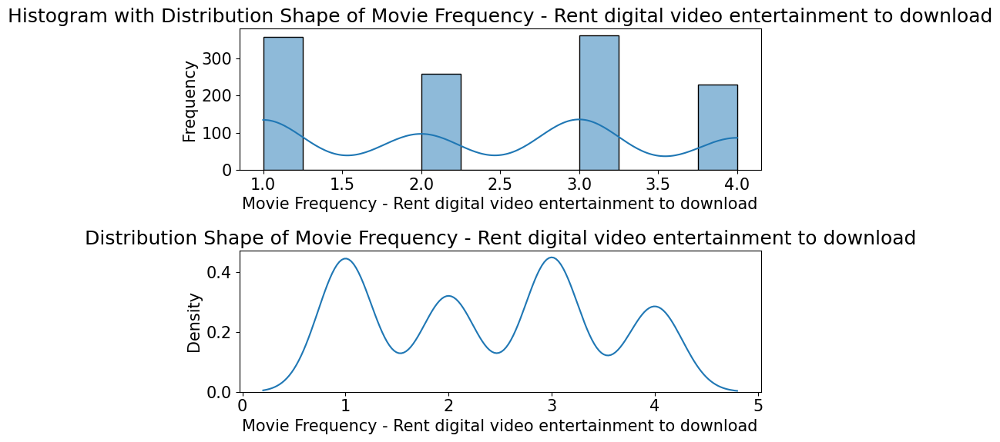

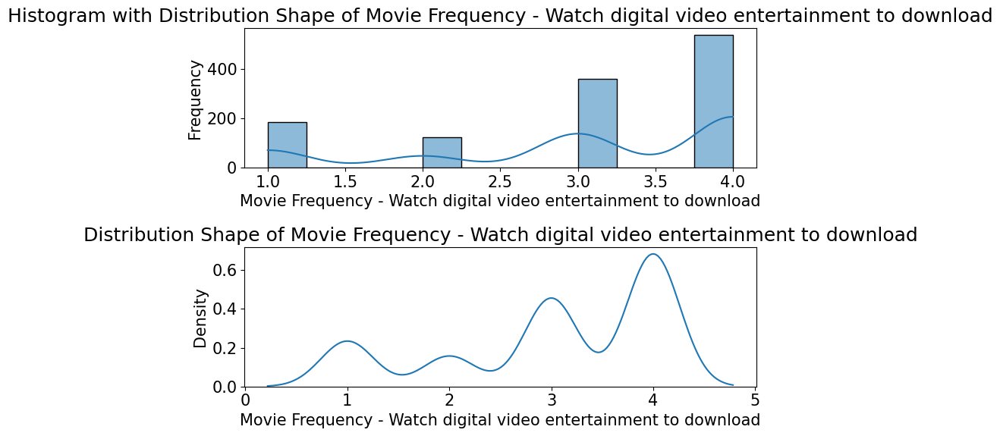

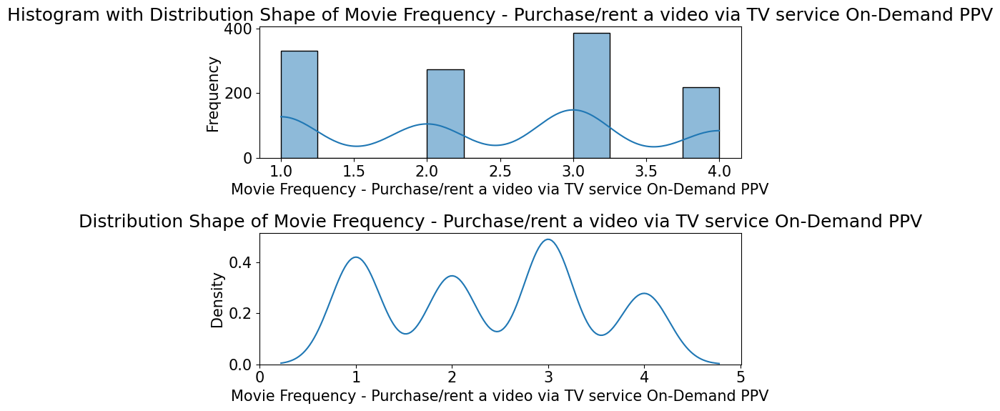

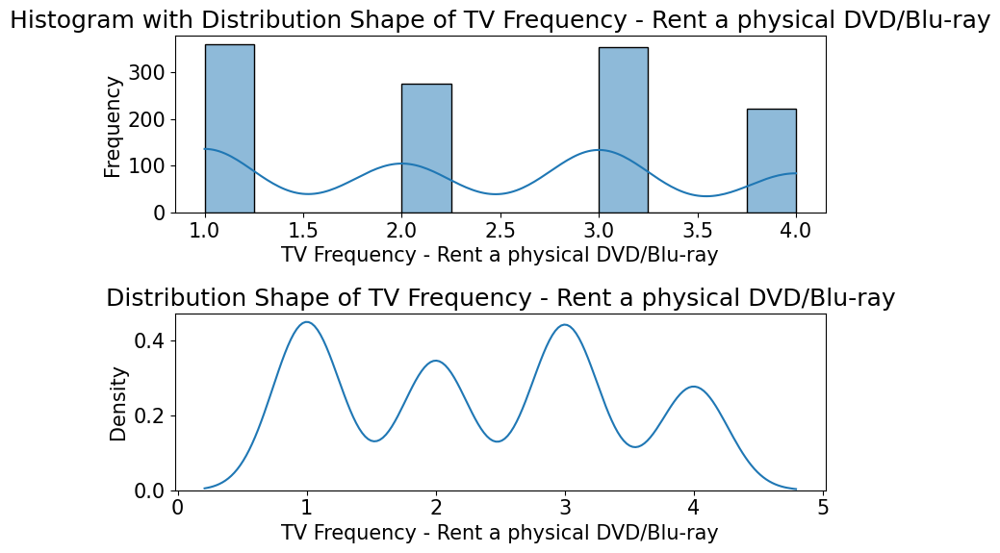

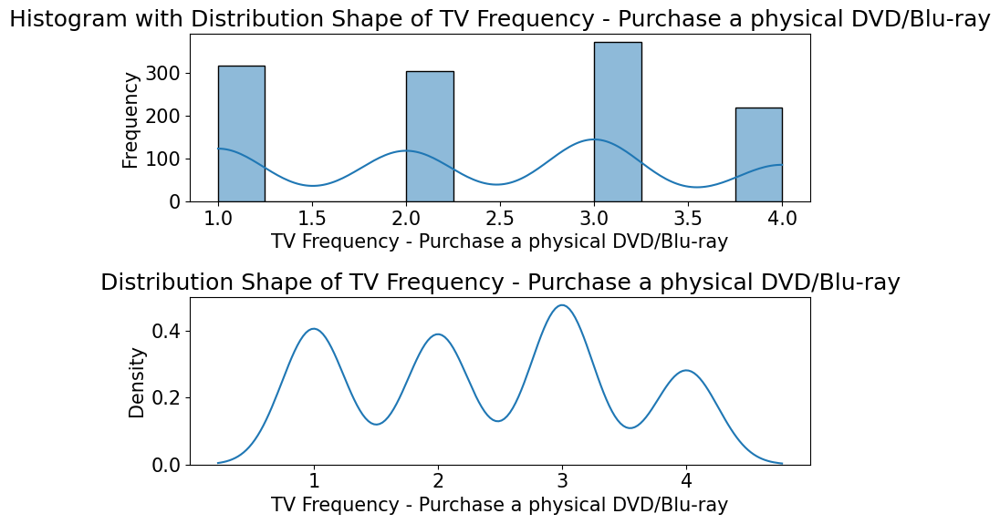

...

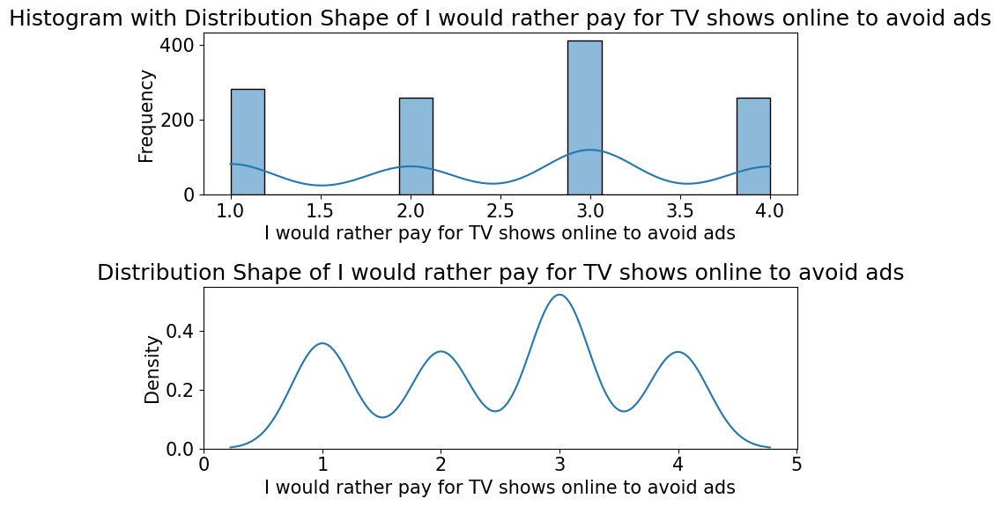

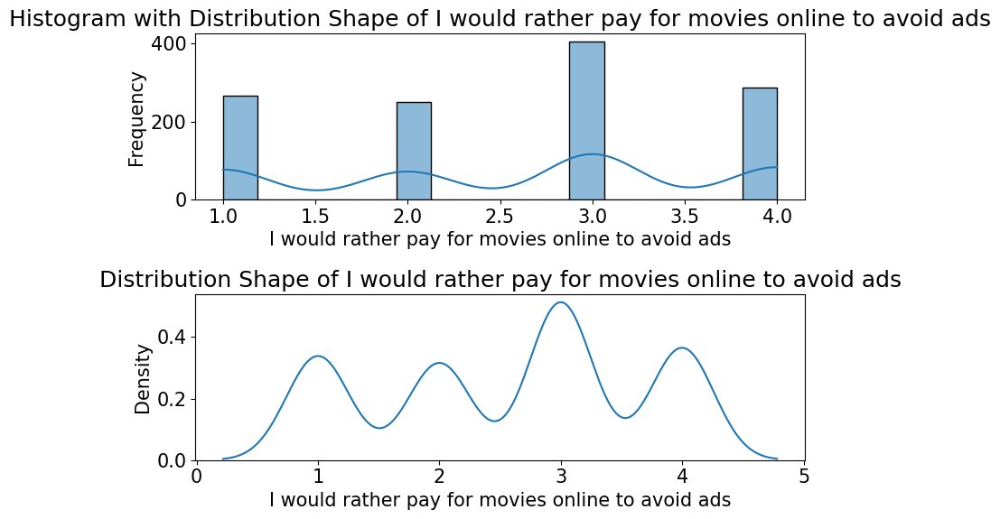

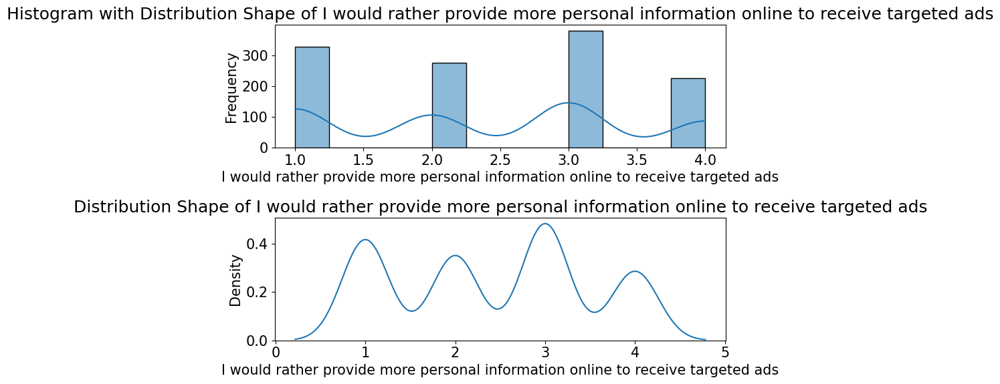

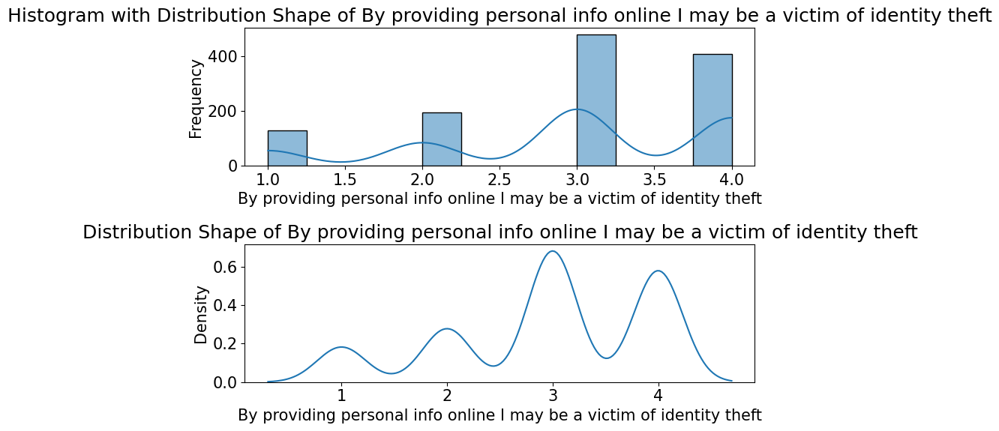

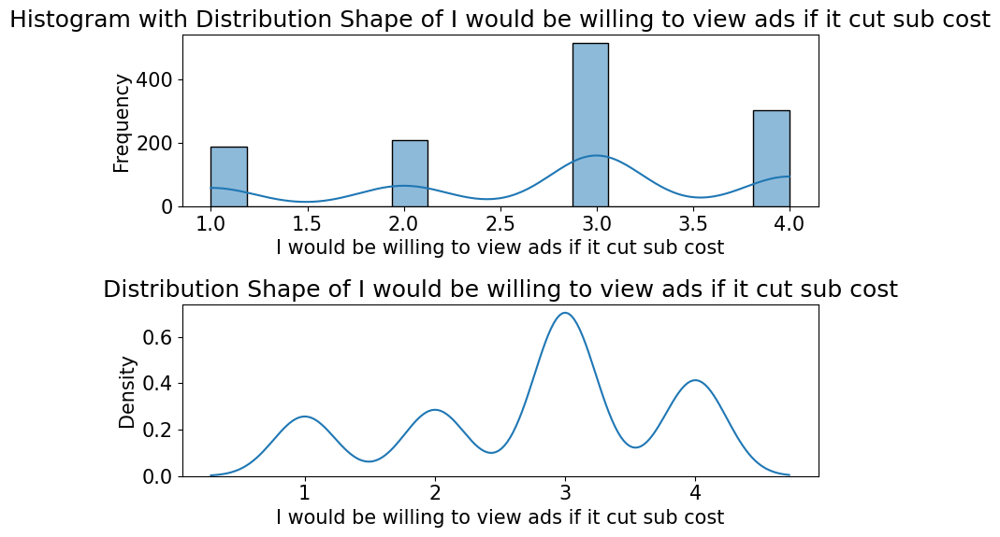

In [47]:
# Define the frequency columns
frequency_columns = ['Movie Frequency - Rent digital video entertainment to download',
                     'Movie Frequency - Watch digital video entertainment to download',
                     'Movie Frequency - Purchase/rent a video via TV service On-Demand PPV',
                     'TV Frequency - Rent a physical DVD/Blu-ray',
                     'TV Frequency - Purchase a physical DVD/Blu-ray',
                     'TV Frequency - Purchase digital video entertainment',
                     'TV Frequency - Watch digital video entertainment via an online streaming service',
                     'TV Frequency - Purchase/rent a video via your television on-demand or PPV',
                     'Frequency of using family or friend subscription log in',
                     'Do during home TV viewing - Read for work/school',
                     'Do during home TV viewing - Read for pleasure',
                     'Do during home TV viewing - Browse and surf the Web',
                     'Do during home TV viewing - Microblogging',
                     'Do during home TV viewing - Read email',
                     'Do during home TV viewing - Write email',
                     'Do during home TV viewing - Text message',
                     'Do during home TV viewing - Use a social network',
                     'Do during home TV viewing - Talk on the phone',
                     'Do during home TV viewing - Browse for products and services online',
                     'Do during home TV viewing - Purchase products and services online',
                     'Do during home TV viewing - Play video games',
                     'I would rather pay for news online to avoid ads',
                     'I would rather pay for sports information online to avoid ads',
                     'I would rather pay for games online to avoid ads',
                     'I would rather pay for music online to avoid ads',
                     'I would rather pay for TV shows online to avoid ads',
                     'I would rather pay for movies online to avoid ads',
                     'I would rather provide more personal information online to receive targeted ads',
                     'By providing personal info online I may be a victim of identity theft',
                     'I would be willing to view ads if it cut sub cost']

# Iterate over each column and plot histograms with distribution shape
for column in frequency_columns:
    plt.figure(figsize=(8, 6))
    
    # Plot histogram
    plt.subplot(2, 1, 1)
    sns.histplot(gaming_df_encoded[column], kde=True)
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.title('Histogram with Distribution Shape of {}'.format(column))
    
    # Plot distribution shape
    plt.subplot(2, 1, 2)
    sns.kdeplot(gaming_df_encoded[column])
    plt.xlabel(column)
    plt.ylabel('Density')
    plt.title('Distribution Shape of {}'.format(column))
    
    # Flag skewed histograms
    skewness = gaming_df_encoded[column].skew()
    if abs(skewness) > 1:
        plt.xlabel(f"Skewness: {skewness:.2f}", color='red')
        plt.axvline(gaming_df_encoded[column].mean(), color='red', linestyle='--')
    
    # Flag high variance
    variance = gaming_df_encoded[column].var()
    if variance > np.percentile(gaming_df_encoded[column].var(), 75):
        plt.xlabel(f"Variance: {variance:.2f}", color='orange')
        plt.axvline(gaming_df_encoded[column].mean(), color='orange', linestyle='--')
    
    plt.tight_layout()
    plt.show()


In [48]:
# Before building a logistic regression, I need to train, test, split the data
# Separate the target variable
column_to_drop = 'Subscriptions - Streaming video service'
X = gaming_df_encoded.drop(columns=[column_to_drop])
y = gaming_df_encoded[column_to_drop]

# Split the data into training and testing sets 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the number of top features to select
k = 9

# Perform SelectKBest feature selection
selector = SelectKBest(score_func=f_classif, k=k)
selector.fit(X_train, y_train)

# Get the selected feature indices
selected_feature_indices = selector.get_support(indices=True)

# Get the selected feature names
selected_features = X_train.columns[selected_feature_indices]

# Calculate VIF for selected features
vif = pd.DataFrame()
vif["Features"] = selected_features
vif["VIF"] = [variance_inflation_factor(X_train[selected_features].values, i) for i in range(len(selected_features))]

# Remove features with VIF scores above 10
selected_features = vif[vif["VIF"] <= 10]["Features"]

# Create a table for selected features
selected_features_table = pd.DataFrame({'Features': selected_features})

# Set the HTML styling for the table
html_table = selected_features_table.style.set_table_attributes('style="font-size: 40pt;"').hide_index().render()

# Print the selected features table with increased font size
display(HTML(html_table))





Features
Own streaming media box or over-the-top box
Own Portable streaming thumb drive/fob
Own Blu-ray disc player/DVD player
Own Gaming console
Own Smartphone
Types of apps used - Streaming video
Subscriptions - Mobile data plan


In [49]:
# Calculate VIF for selected features
vif = pd.DataFrame()
vif["Features"] = X_train[selected_features].columns
vif["VIF"] = [variance_inflation_factor(X_train[selected_features].values, i) for i in range(X_train[selected_features].shape[1])]

# Display VIF scores
print("VIF Scores:")
print(vif)


VIF Scores:
                                      Features       VIF
0  Own streaming media box or over-the-top box  1.596914
1       Own Portable streaming thumb drive/fob  1.453122
2           Own Blu-ray disc player/DVD player  2.314470
3                           Own Gaming console  2.461642
4                               Own Smartphone  3.329887
5         Types of apps used - Streaming video  1.717559
6             Subscriptions - Mobile data plan  2.373348


Optimization terminated successfully.
         Current function value: 0.542688
         Iterations 6
                                      Logit Regression Results                                     
Dep. Variable:     Subscriptions - Streaming video service   No. Observations:                  967
Model:                                               Logit   Df Residuals:                      959
Method:                                                MLE   Df Model:                            7
Date:                                     Tue, 18 Jul 2023   Pseudo R-squ.:                  0.2147
Time:                                             14:41:41   Log-Likelihood:                -524.78
converged:                                            True   LL-Null:                       -668.22
Covariance Type:                                 nonrobust   LLR p-value:                 3.823e-58
                                                  coef    std err          z      P>|z|      [0.02

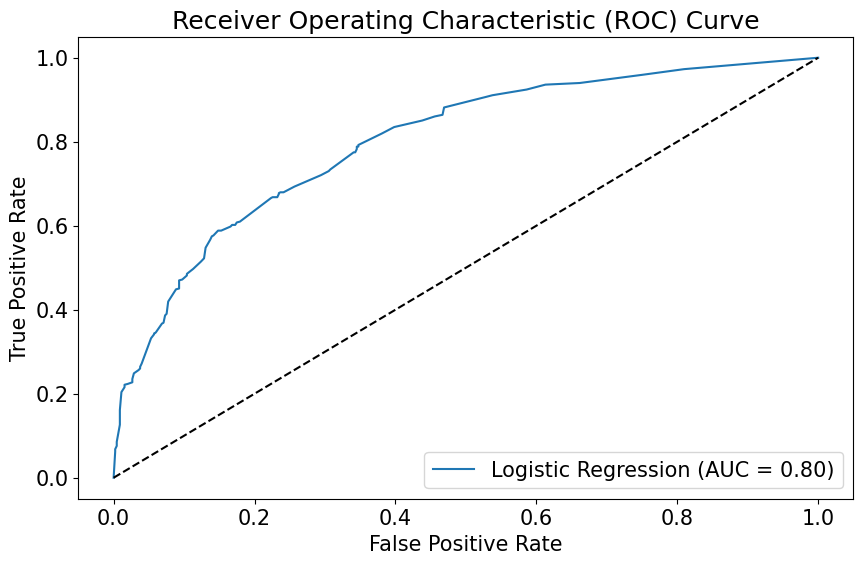

Training Accuracy: 0.6546018614270941
Precision: 0.8605577689243028
Recall: 0.41941747572815535
F1 Score: 0.5639686684073107
ROC AUC Score: 0.7993706503995188


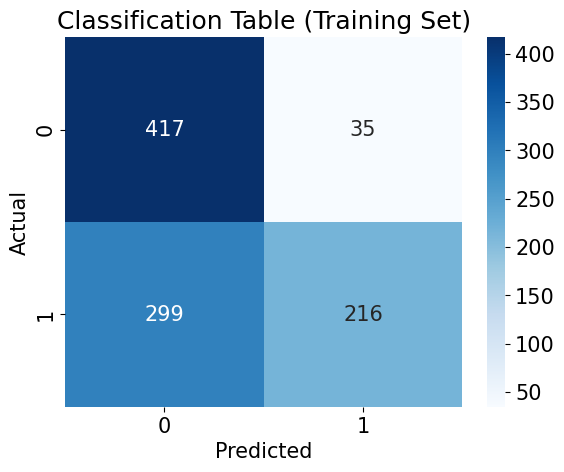

True Positives: 216
True Negatives: 417
False Positives: 35
False Negatives: 299


In [50]:

# Initialize the scaler
scaler = StandardScaler()

# Fit the scaler on the training data
scaler.fit(X_train[selected_features].dropna())

# Fitting / Training the Logistic Regression Model
logreg = LogisticRegression()
logreg.fit(X_train[selected_features], y_train)

# Predict on the training set
X_train_selected_scaled = scaler.transform(X_train[selected_features].dropna())
y_train_pred = logreg.predict(X_train_selected_scaled)
y_train_pred_proba = logreg.predict_proba(X_train_selected_scaled)[:, 1]

# Calculate evaluation metrics on the training set
train_accuracy = accuracy_score(y_train, y_train_pred)
precision = precision_score(y_train, y_train_pred)
recall = recall_score(y_train, y_train_pred)
f1 = f1_score(y_train, y_train_pred)
roc_auc = roc_auc_score(y_train, y_train_pred_proba)

# Classification table on the training set
classification_table = pd.crosstab(y_train, y_train_pred, rownames=['Actual'], colnames=['Predicted'])

# Display the logistic regression output table
logit_model = sm.Logit(y_train, sm.add_constant(X_train[selected_features].dropna()))
logit_results = logit_model.fit()
print(logit_results.summary())

# Plot ROC curve on the training set
fpr, tpr, thresholds = roc_curve(y_train, y_train_pred_proba)
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label='Logistic Regression (AUC = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Print evaluation metrics on the training set
print("Training Accuracy:", train_accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("ROC AUC Score:", roc_auc)

# Display classification table on the training set
sns.heatmap(classification_table, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Classification Table (Training Set)')
plt.show()

# Calculate true positives, true negatives, false positives, false negatives
true_positives = classification_table.loc[1, 1]
true_negatives = classification_table.loc[0, 0]
false_positives = classification_table.loc[0, 1]
false_negatives = classification_table.loc[1, 0]

# Print the counts
print("True Positives:", true_positives)
print("True Negatives:", true_negatives)
print("False Positives:", false_positives)
print("False Negatives:", false_negatives)



Optimization terminated successfully.
         Current function value: 0.532618
         Iterations 6
                                      Logit Regression Results                                     
Dep. Variable:     Subscriptions - Streaming video service   No. Observations:                  242
Model:                                               Logit   Df Residuals:                      234
Method:                                                MLE   Df Model:                            7
Date:                                     Tue, 18 Jul 2023   Pseudo R-squ.:                  0.2278
Time:                                             14:41:41   Log-Likelihood:                -128.89
converged:                                            True   LL-Null:                       -166.91
Covariance Type:                                 nonrobust   LLR p-value:                 8.812e-14
                                                  coef    std err          z      P>|z|      [0.02

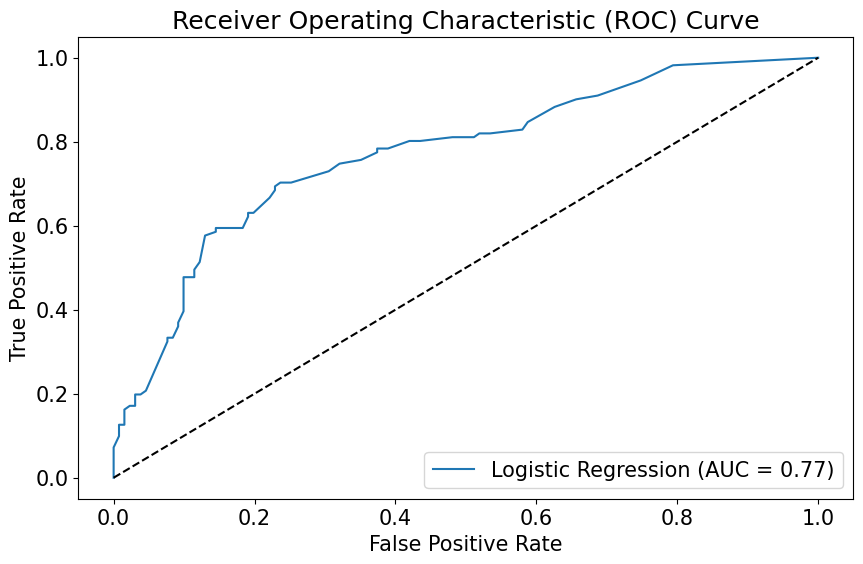

Testing Accuracy: 0.6859504132231405
Precision: 0.7868852459016393
Recall: 0.43243243243243246
F1 Score: 0.5581395348837209
ROC AUC Score: 0.7718863902070009


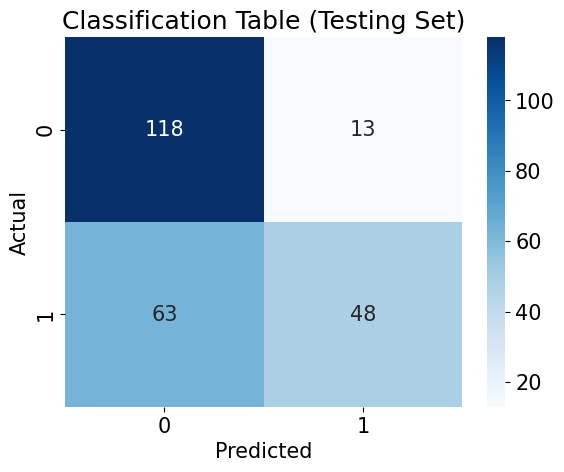

True Positives: 48
True Negatives: 118
False Positives: 13
False Negatives: 63


In [51]:
# Predict on the testing set
X_test_selected_scaled = scaler.transform(X_test[selected_features].dropna())
y_test_pred = logreg.predict(X_test_selected_scaled)
y_test_pred_proba = logreg.predict_proba(X_test_selected_scaled)[:, 1]

# Calculate evaluation metrics on the testing set
test_accuracy = accuracy_score(y_test, y_test_pred)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_pred_proba)

# Classification table on the testing set
classification_table = pd.crosstab(y_test, y_test_pred, rownames=['Actual'], colnames=['Predicted'])

# Display the logistic regression output table
logit_model = sm.Logit(y_test, sm.add_constant(X_test[selected_features].dropna()))
logit_results = logit_model.fit()
print(logit_results.summary())

# Plot ROC curve on the testing set
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred_proba)
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label='Logistic Regression (AUC = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Print evaluation metrics on the testing set
print("Testing Accuracy:", test_accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("ROC AUC Score:", roc_auc)

# Display classification table on the testing set
sns.heatmap(classification_table, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Classification Table (Testing Set)')
plt.show()

# Calculate true positives, true negatives, false positives, false negatives
true_positives = classification_table.loc[1, 1]
true_negatives = classification_table.loc[0, 0]
false_positives = classification_table.loc[0, 1]
false_negatives = classification_table.loc[1, 0]

# Print the counts
print("True Positives:", true_positives)
print("True Negatives:", true_negatives)
print("False Positives:", false_positives)
print("False Negatives:", false_negatives)


Classification Table (Testing Set):
 Predicted   0
Actual       
0           9
1          11


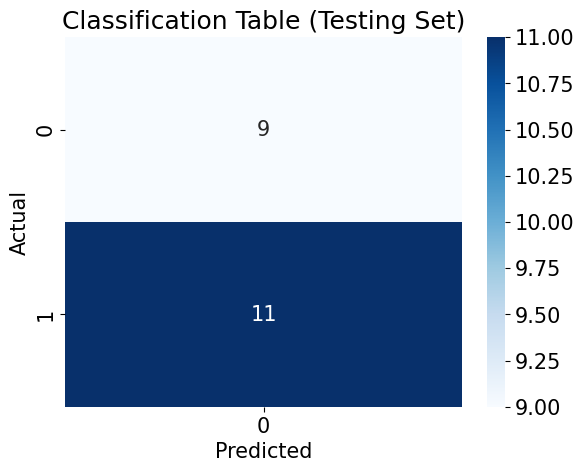

Testing Accuracy: 0.45
Precision (Testing): 0.0
Recall (Testing): 0.0
F1 Score (Testing): 0.0
True Positives (Testing): 0
True Negatives (Testing): 9
False Positives (Testing): 11
False Negatives (Testing): 0


In [52]:
# I need to know how this might perform against a dummy model (baseline)
# Below, I've created a synthetic classification system and based on samples, features to produce a dummy classifier

# Generate a synthetic classification dataset
X, y = make_classification(n_samples=100, n_features=10, random_state=42)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a dummy classifier with a strategy of 'most_frequent'
dummy_classifier = DummyClassifier(strategy='most_frequent')

# Fit the dummy classifier to the training data
dummy_classifier.fit(X_train, y_train)

# Make predictions on the testing set
y_test_pred = dummy_classifier.predict(X_test)

# Create classification table on the testing set
classification_table_test = pd.crosstab(pd.Series(y_test, name='Actual'), pd.Series(y_test_pred, name='Predicted'))

# Display classification table on the testing set
print("Classification Table (Testing Set):\n", classification_table_test)

# Calculate evaluation metrics on the testing set
test_accuracy = accuracy_score(y_test, y_test_pred)
precision_test = precision_score(y_test, y_test_pred)
recall_test = recall_score(y_test, y_test_pred)
f1_test = f1_score(y_test, y_test_pred)

# Display heatmap of the classification table
sns.heatmap(classification_table_test, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Classification Table (Testing Set)')
plt.show()

# Print evaluation metrics on the testing set
print("Testing Accuracy:", test_accuracy)
print("Precision (Testing):", precision_test)
print("Recall (Testing):", recall_test)
print("F1 Score (Testing):", f1_test)

# Since the dummy classifier doesn't provide probabilities, we can't calculate ROC AUC score and plot ROC curve

# Calculate true positives, true negatives, false positives, false negatives on the testing set
true_positives_test = 0
true_negatives_test = classification_table_test.loc[0, 0]
false_positives_test = classification_table_test.loc[1, 0]
false_negatives_test = 0

# Print the counts on the testing set
print("True Positives (Testing):", true_positives_test)
print("True Negatives (Testing):", true_negatives_test)
print("False Positives (Testing):", false_positives_test)
print("False Negatives (Testing):", false_negatives_test)


In [53]:
# The dummy classifier performed markedly less well than the logistic regression
# As a result, this appears to be a good model, and it is necessary to run cross-validation
# This is useful to ensure that the model works with the patterns of data

# Create a logistic regression model
model = LogisticRegression()

# Perform cross-validation
cv_scores = cross_val_score(model, X, y, cv=5)  # Specify the number of folds (e.g., cv=5 for 5-fold cross-validation)

# Create a DataFrame to store the cross-validation scores
cv_scores_df = pd.DataFrame({'Cross-Validation Score': cv_scores})

# Print the cross-validation scores in a table format
print(tabulate(cv_scores_df, headers='keys', tablefmt='psql'))

# Calculate the mean and standard deviation of the cross-validation scores
mean_cv_score = np.mean(cv_scores)
std_cv_score = np.std(cv_scores)

# Print the mean and standard deviation of the cross-validation scores
print("Mean CV Score:", mean_cv_score)
print("Std CV Score:", std_cv_score)


+----+--------------------------+
|    |   Cross-Validation Score |
|----+--------------------------|
|  0 |                     0.9  |
|  1 |                     1    |
|  2 |                     0.85 |
|  3 |                     0.95 |
|  4 |                     0.95 |
+----+--------------------------+
Mean CV Score: 0.93
Std CV Score: 0.05099019513592784


In [54]:
# In light of the cross-validation scores, there is high accuracy in predicting target variable
# Additionally, the standard deviation is low

#As a last measure,I wanted to attempt hyperparameter tuning to see if the accepted model could be improved upon
clf = [
    LogisticRegression(solver='newton-cg', penalty='none', max_iter=1000),
    LogisticRegression(solver='lbfgs', penalty='none', max_iter=1000),
    LogisticRegression(solver='sag', penalty='none', max_iter=1000),
    LogisticRegression(solver='saga', penalty='none', max_iter=1000),
    LogisticRegression(solver='saga', penalty='elasticnet', l1_ratio=1.0, max_iter=1000)
]

clf_columns = ['Train Accuracy', 'Test Accuracy', 'Precision', 'Recall', 'AUC']
clf_compare = pd.DataFrame(columns=clf_columns)

for alg in clf:
    predicted = alg.fit(X_train, y_train).predict(X_test)
    fp, tp, th = roc_curve(y_test, predicted)
    clf_name = alg.__class__.__name__
    train_accuracy = round(alg.score(X_train, y_train), 5)
    test_accuracy = round(alg.score(X_test, y_test), 5)
    precision = round(precision_score(y_test, predicted), 5)
    recall = round(recall_score(y_test, predicted), 5)
    roc_auc = round(roc_auc_score(y_test, predicted), 5)

    clf_compare.loc[len(clf_compare)] = [train_accuracy, test_accuracy, precision, recall, roc_auc]

clf_compare.sort_values(by='Test Accuracy', ascending=False, inplace=True)
print(clf_compare)


   Train Accuracy  Test Accuracy  Precision   Recall      AUC
0          1.0000           1.00        1.0  1.00000  1.00000
2          1.0000           1.00        1.0  1.00000  1.00000
3          1.0000           1.00        1.0  1.00000  1.00000
4          0.9875           1.00        1.0  1.00000  1.00000
1          1.0000           0.95        1.0  0.90909  0.95455


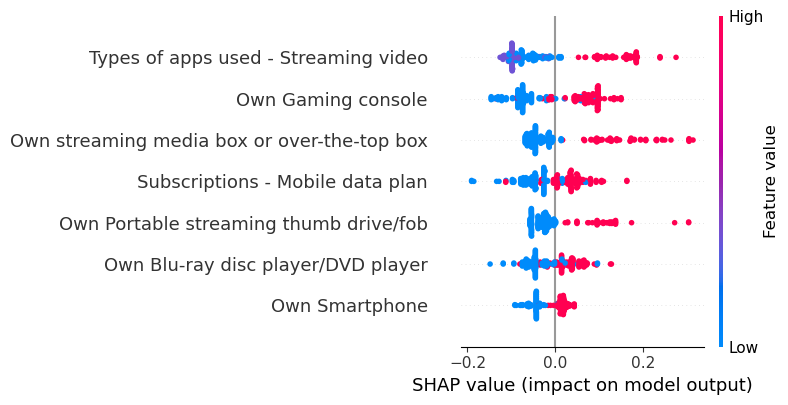

In [55]:
# There wasn't much of an improvement with hyper-parameter tuning
# Finally, I'm a fan of Shapley values as a data visualization to help people understand results

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(gaming_df_encoded[selected_features], gaming_df_encoded['Subscriptions - Streaming video service'], test_size=0.2, random_state=42)

# Train a machine learning model (Random Forest Regressor)
model = RandomForestRegressor()
model.fit(X_train, y_train)

# Initialize the explainer object
explainer = shap.Explainer(model, X_train)

# Calculate Shapley values for the testing data
shap_values = explainer.shap_values(X_test)

# Create a summary plot of Shapley values

shap.summary_plot(shap_values, X_test)

In [56]:
# Get features
y = gaming_df_encoded['Subscriptions - Streaming video service']
X = gaming_df_encoded[selected_features]

# Train model
model = xgb.XGBRegressor(objective="reg:squarederror") 
model.fit(X, y)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [57]:
#Get shap values
explainer = shap.Explainer(model)
shap_values = explainer(X)

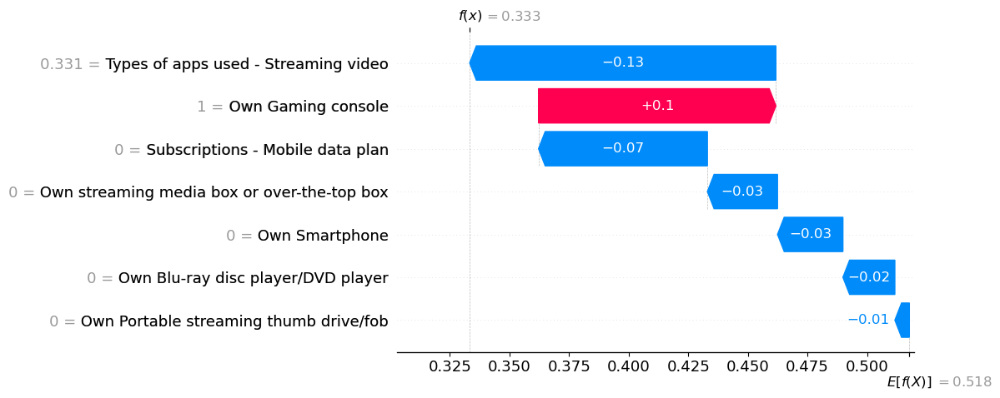

In [58]:
# Waterfall plot for first observation
shap.plots.waterfall(shap_values[0])

In [59]:
import json

# Assuming you have already trained the logistic regression model and stored it in logit_results

# Get the model parameters
params = logit_results.params

# Convert the model parameters to a dictionary
model_dict = {'params': params.tolist()}

# Save the model to a JSON file
with open('logit_model.json', 'w') as f:
    json.dump(model_dict, f)


In [65]:
import pandas as pd

# Assuming you have the DataFrame 'gaming_df_encoded' already defined and cleaned
# If not, make sure to create and clean the DataFrame before proceeding

# Save the DataFrame to a CSV file with tab delimiter
gaming_df_encoded.to_csv("gaming_df_encoded.csv", index=False, sep='\t')

import pandas as pd
from IPython.display import FileLink

# Save the DataFrame to an Excel file (.xlsx)
gaming_df_encoded.to_excel("gaming_df_encoded.xlsx", index=False)

# Create a clickable link to download the CSV file
csv_link = FileLink("gaming_df_encoded.xlsx")
csv_link
#Be sure to click on link below and then save as CSV
#This will ensure a smooth transition, as CSV -> XLSX sometimes doesn't work well

C:\Users\19144\gaming_df_encoded.csv

In [66]:
# Save the DataFrame to an Excel file (.xlsx)
gaming_df_encoded.to_excel("gaming_df_encoded.xlsx", index=False)
